In [ ]:
##EDA & Data cleansing

שאלות לאורית-,
1.מה לעשות עם עמודת high_school'- לרשום בהיילייטס 
2. במידה ויש לנו גובה השחקן בסנטימטר,האם אני יכול למחוק את העמודת באינצ׳(6-5)? כן 
3.יש לי את עמודות -שנת לידה, חודש לידה ותאריך לידה- להשאיר חודש,שנה ולחשב את הגיל בעונה 19-20
האם אני יכול ליצור עמודת ״גיל״ ולמחוק את שלושת העמודות האחרות??
האם אני מחשב גיל כיום או נכון לעונה שבחרתי-2019-2020?
בשלב הפיצ׳ר אינג׳נירינג 4.?אם זה השלב שבו אני יכול להכניס לדאטה פיצ׳רים? כמו נקודות למשחק

In [250]:
#Read a pickle file and load the data
import pickle
with open('Data_Preperation.pkl', 'rb') as file:
  df = pickle.load(file)

In [251]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sb
from scipy.stats import zscore, ks_2samp

In [252]:
df.head()

,Player,GP,MIN,FGM,FGA,3PM,3PA,FTM,FTA,TOV,PF,ORB,DRB,REB,AST,STL,BLK,PTS,birth_year,birth_month,height_cm,weight,weight_kg,nationality,draft_round,draft_pick,draft_team,nba_played,playoff_played,unique_id,teams_each_player,leagues_each_player,age,position
0,Kelsey Barlow,27,789.4,179,414,68,203,81,98,55,74,19,103,122,90,45,14,507,1991.0,Feb,196.0,200.0,91.0,United States,NaN,NaN,nan,0,0,fefc9789e91e4fc3b9b3e97506417ab2,1,1,29.514031,GF
1,Anthony Young,25,806.6,160,329,51,125,92,108,34,59,18,123,141,50,20,10,463,1989.0,Dec,201.0,255.0,116.0,United States,NaN,NaN,nan,0,0,6354c53dfc7f4835a8215d86cc95be6c,1,1,31.694045,C
2,Pedro Barral,25,759.8,153,331,33,93,102,131,78,52,13,84,97,141,24,0,441,1994.0,Oct,185.0,175.0,79.0,Argentina,NaN,NaN,nan,0,0,8ea081fb36ef4fd4a4698817ea5f66b4,1,1,26.834360,PG
3,Federico Mariani,24,856.3,120,277,44,112,135,151,55,36,13,69,82,67,15,2,419,1992.0,Apr,191.0,NaN,NaN,Argentina,NaN,NaN,nan,0,0,906da9fbdb0648d8affdb0c40005e87c,1,1,28.350445,F
4,Caio De Souza Pacheco,21,582.7,134,296,30,104,110,145,72,49,7,59,66,126,17,2,408,1999.0,Feb,188.0,190.0,86.0,Brazil,NaN,NaN,nan,0,0,cc33d7c5addd4e508aec7c7c4c3fac89,1,1,21.492129,Other


In [253]:
#Data Protocol
numeric_df = df.select_dtypes(include=['int', 'float'])
with pd.ExcelWriter('df_results.xlsx', engine='xlsxwriter') as writer:
    # Save the DataFrame dtypes to the first sheet
    df.dtypes.to_frame(name='Dtypes').to_excel(writer, sheet_name='data_type')
    
    # Save the DataFrame max values to the second sheet
    numeric_df.max().to_frame(name='Max Values').to_excel(writer, sheet_name='Max')
    
    # Save the DataFrame min values to the third sheet
    numeric_df.min().to_frame(name='Min Values').to_excel(writer, sheet_name='Min')
    
    # Save the sum of null values per column to the fourth sheet
    df.isnull().sum(axis=0).to_frame(name='Null Count').to_excel(writer, sheet_name='Null Count')
    
    # Save the count of unique values per column to the fifth sheet
    df.nunique().to_frame(name='Unique Count').to_excel(writer, sheet_name='Unique Count')


Shape of your Data Set loaded: (6478, 34)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  6
    Number of Integer-Categorical Columns =  18
    Number of String-Categorical Columns =  6
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  2
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  0
    Number of Columns to Delete =  2
    34 Predictors classified...
        2 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['draft_round', 'draft_pick']
6 numeric variables in data exceeds l

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Player,object,0.000000,97,,,6304 rare categories: Too many to list. Group them into a single category or drop the categories.
GP,int64,0.000000,1,3.000000,94.000000,"Column has 523 outliers greater than upper bound (48.50) or lower than lower bound(-3.50). Cap them or remove them., Column has a high correlation with ['MIN']. Consider dropping one of them."
MIN,float64,0.000000,NA,13.000000,3104.200000,Column has 376 outliers greater than upper bound (1310.19) or lower than lower bound(-346.11). Cap them or remove them.
FGM,int64,0.000000,6,0.000000,857.000000,"Column has 381 outliers greater than upper bound (222.00) or lower than lower bound(-82.00). Cap them or remove them., Column has a high correlation with ['MIN']. Consider dropping one of them."
FGA,int64,0.000000,10,1.000000,1742.000000,"Column has 385 outliers greater than upper bound (463.50) or lower than lower bound(-156.50). Cap them or remove them., Column has a high correlation with ['MIN', 'FGM']. Consider dropping one of them."
3PM,int64,0.000000,2,0.000000,338.000000,"Column has 373 outliers greater than upper bound (77.50) or lower than lower bound(-38.50). Cap them or remove them., Column has a high correlation with ['FGA']. Consider dropping one of them."
3PA,int64,0.000000,5,0.000000,960.000000,"Column has 347 outliers greater than upper bound (210.50) or lower than lower bound(-97.50). Cap them or remove them., Column has a high correlation with ['MIN', 'FGA', '3PM']. Consider dropping one of them."
FTM,int64,0.000000,3,0.000000,790.000000,"Column has 364 outliers greater than upper bound (111.00) or lower than lower bound(-49.00). Cap them or remove them., Column has a high correlation with ['FGM', 'FGA']. Consider dropping one of them."
FTA,int64,0.000000,4,0.000000,916.000000,"Column has 364 outliers greater than upper bound (144.50) or lower than lower bound(-59.50). Cap them or remove them., Column has a high correlation with ['FGM', 'FGA', 'FTM']. Consider dropping one of them."
TOV,int64,0.000000,2,0.000000,353.000000,"Column has 339 outliers greater than upper bound (87.50) or lower than lower bound(-28.50). Cap them or remove them., Column has a high correlation with ['MIN', 'FGM', 'FGA', 'FTM', 'FTA']. Consider dropping one of them."


Number of All Scatter Plots = 21


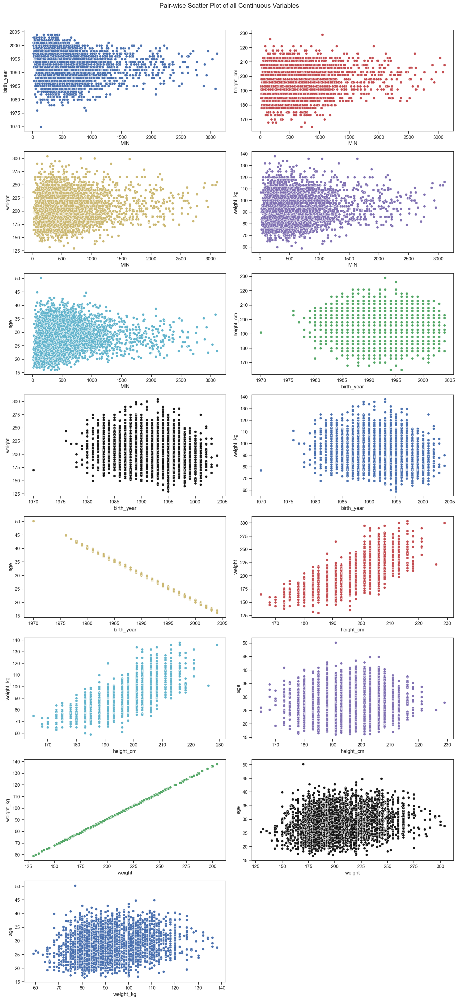

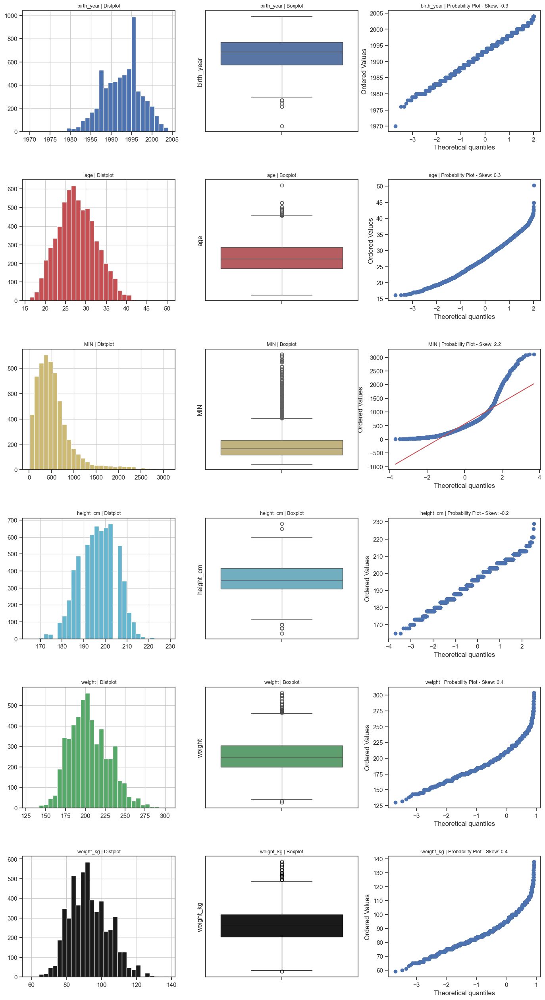

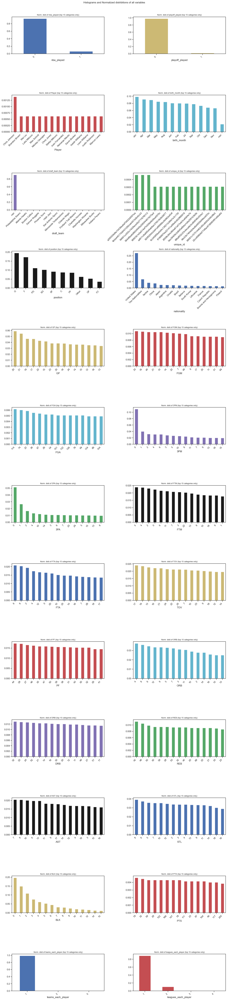

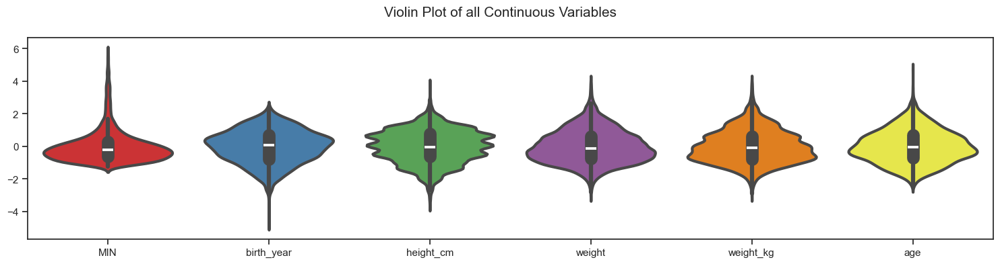

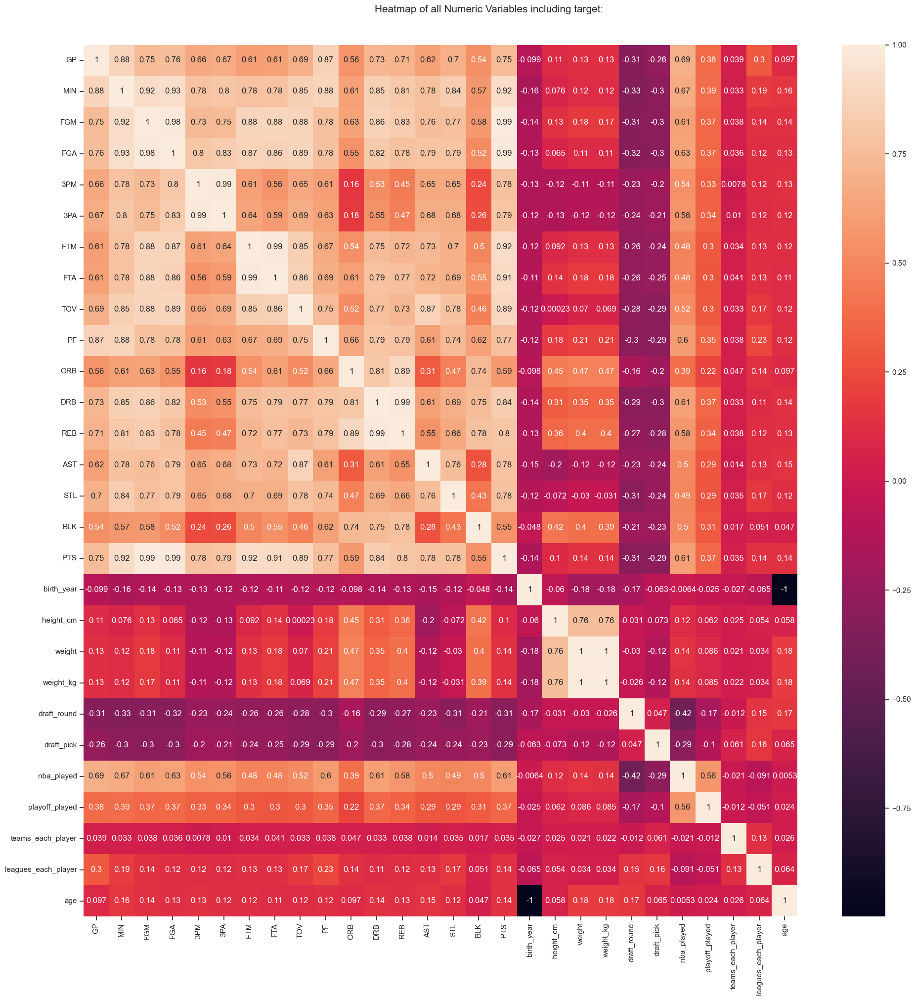

All Plots done
Time to run AutoViz = 17 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


,Player,GP,MIN,FGM,FGA,3PM,3PA,FTM,FTA,TOV,PF,ORB,DRB,REB,AST,STL,BLK,PTS,birth_year,birth_month,height_cm,weight,weight_kg,nationality,draft_round,draft_pick,draft_team,nba_played,playoff_played,unique_id,teams_each_player,leagues_each_player,age,position
0,Kelsey Barlow,27,789.4,179,414,68,203,81,98,55,74,19,103,122,90,45,14,507,1991.0,Feb,196.0,200.0,91.0,United States,NaN,NaN,nan,0,0,fefc9789e91e4fc3b9b3e97506417ab2,1,1,29.514031,GF
1,Anthony Young,25,806.6,160,329,51,125,92,108,34,59,18,123,141,50,20,10,463,1989.0,Dec,201.0,255.0,116.0,United States,NaN,NaN,nan,0,0,6354c53dfc7f4835a8215d86cc95be6c,1,1,31.694045,C
2,Pedro Barral,25,759.8,153,331,33,93,102,131,78,52,13,84,97,141,24,0,441,1994.0,Oct,185.0,175.0,79.0,Argentina,NaN,NaN,nan,0,0,8ea081fb36ef4fd4a4698817ea5f66b4,1,1,26.834360,PG
3,Federico Mariani,24,856.3,120,277,44,112,135,151,55,36,13,69,82,67,15,2,419,1992.0,Apr,191.0,NaN,NaN,Argentina,NaN,NaN,nan,0,0,906da9fbdb0648d8affdb0c40005e87c,1,1,28.350445,F
4,Caio De Souza Pacheco,21,582.7,134,296,30,104,110,145,72,49,7,59,66,126,17,2,408,1999.0,Feb,188.0,190.0,86.0,Brazil,NaN,NaN,nan,0,0,cc33d7c5addd4e508aec7c7c4c3fac89,1,1,21.492129,Other
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6473,Anuar Rahimshaikov,13,91.6,8,17,0,2,5,5,4,10,1,6,7,4,4,0,21,1997.0,Mar,188.0,162.0,73.0,Ukraine,NaN,NaN,nan,0,0,46ae1416450d417f87b313b087864547,1,1,23.405886,SG
6474,Kyrylo Meshheryakov,15,127.0,7,28,2,13,3,4,5,27,4,14,18,8,1,3,19,1995.0,Aug,198.0,182.0,83.0,Ukraine,NaN,NaN,nan,0,0,9495d3ff0f6649fb92fdc98863e7a6ad,1,1,25.010267,F
6475,Yaroslav Kadygrob,10,81.7,5,16,4,14,1,3,3,2,2,4,6,3,0,0,15,1991.0,Oct,191.0,187.0,85.0,Ukraine,NaN,NaN,nan,0,0,21c3d427035f4c96b2eed4c4ddc8acd5,1,1,29.813142,G
6476,Ernesto Tkachuk,16,124.7,1,15,0,11,7,14,11,12,0,15,15,10,6,1,9,1994.0,Sep,188.0,200.0,91.0,Ukraine,NaN,NaN,nan,0,0,c98a3ecd9078448a98a0f3097ef785c6,1,1,26.924709,PG


In [93]:
#!pip install autoviz
from autoviz.AutoViz_Class import AutoViz_Class
%matplotlib inline

AV = AutoViz_Class()
AV.AutoViz(df)

In [254]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6478 entries, 0 to 6477
Data columns (total 34 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Player               6478 non-null   object 
 1   GP                   6478 non-null   int64  
 2   MIN                  6478 non-null   float64
 3   FGM                  6478 non-null   int64  
 4   FGA                  6478 non-null   int64  
 5   3PM                  6478 non-null   int64  
 6   3PA                  6478 non-null   int64  
 7   FTM                  6478 non-null   int64  
 8   FTA                  6478 non-null   int64  
 9   TOV                  6478 non-null   int64  
 10  PF                   6478 non-null   int64  
 11  ORB                  6478 non-null   int64  
 12  DRB                  6478 non-null   int64  
 13  REB                  6478 non-null   int64  
 14  AST                  6478 non-null   int64  
 15  STL                  6478 non-null   i

In [255]:
df.shape

(6478, 34)

In [256]:
df.describe()

,GP,MIN,FGM,FGA,3PM,3PA,FTM,FTA,TOV,PF,ORB,DRB,REB,AST,STL,BLK,PTS,birth_year,height_cm,weight,weight_kg,draft_round,draft_pick,nba_played,playoff_played,teams_each_player,leagues_each_player,age
count,6478.000000,6478.000000,6478.000000,6478.000000,6478.000000,6478.000000,6478.000000,6478.000000,6478.000000,6478.000000,6478.000000,6478.000000,6478.000000,6478.000000,6478.000000,6478.000000,6478.000000,6338.000000,6442.000000,5322.000000,5322.000000,584.000000,584.000000,6478.000000,6478.000000,6478.000000,6478.000000,6338.000000
mean,25.437944,558.788268,86.122877,186.776320,25.318617,72.039055,40.295616,54.174745,34.519759,53.221365,24.811979,70.046002,94.857981,51.193424,19.507564,7.523001,237.888237,1992.683654,196.410432,204.873356,92.959790,1.416096,14.616438,0.064989,0.021612,1.008799,1.121797,27.802402
std,15.032745,442.133469,88.675968,185.387748,31.749970,83.538125,50.867984,63.770209,31.488803,37.833151,27.410412,74.338742,97.825835,64.173017,17.801407,13.633778,247.360987,4.757969,8.718482,25.012362,11.349328,0.493332,8.674610,0.246526,0.145423,0.110089,0.354268,4.771660
min,3.000000,13.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1970.000000,165.000000,130.000000,59.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,16.120465
25%,16.000000,275.000000,32.000000,76.000000,5.000000,18.000000,11.000000,17.000000,15.000000,28.000000,8.000000,26.000000,36.000000,14.000000,8.000000,1.000000,88.000000,1989.000000,191.000000,186.000000,84.000000,1.000000,7.000000,0.000000,0.000000,1.000000,1.000000,24.443532
50%,21.000000,458.000000,64.000000,141.000000,16.000000,50.000000,27.000000,38.000000,27.000000,45.000000,16.000000,51.000000,68.000000,32.000000,15.000000,3.000000,177.000000,1993.000000,196.000000,202.000000,92.000000,1.000000,14.000000,0.000000,0.000000,1.000000,1.000000,27.478439
75%,29.000000,689.075000,108.000000,231.000000,34.000000,95.000000,51.000000,68.000000,44.000000,66.000000,32.000000,86.000000,118.000000,63.000000,25.750000,8.000000,299.000000,1996.000000,203.000000,220.000000,100.000000,2.000000,22.000000,0.000000,0.000000,1.000000,1.000000,31.038330
max,94.000000,3104.200000,857.000000,1742.000000,338.000000,960.000000,790.000000,916.000000,353.000000,290.000000,265.000000,813.000000,996.000000,868.000000,145.000000,206.000000,2690.000000,2004.000000,229.000000,304.000000,138.000000,2.000000,30.000000,1.000000,1.000000,2.000000,4.000000,50.269678


In [257]:
#Skewness
def highlight(cell_value):
    highlight = 'background-color: mediumspringgreen;'
    default = ''
    negative = 'background-color: hotpink;'
    if cell_value > 1:
        return highlight
    elif cell_value < -1:
        return negative
    #else
       # return default  
pd.DataFrame(con_df.skew(),columns=['skewness']).sort_values(by='skewness', ascending=False).style.applymap(highlight)

,skewness
teams_each_player,6.357513
FTM,4.696053
FTA,4.341064
AST,3.924136
DRB,3.446180
PTS,3.274481
REB,3.268078
FGA,3.154930
FGM,3.130637
TOV,3.126707


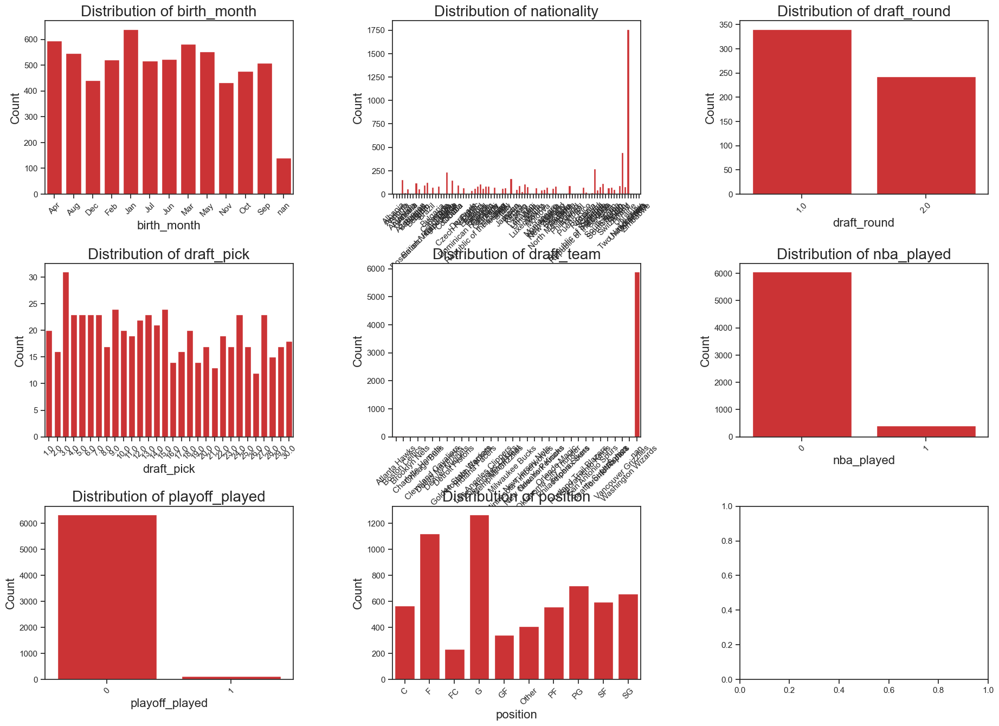

In [258]:

import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df is your DataFrame and the columns are already converted to categorical
cols = ['birth_month', 'draft_round', 'draft_pick','draft_team', 'nationality','nba_played','playoff_played','position']
df[cols] = df[cols].astype('category')

# Filter out the categorical columns
categorical_df = df.select_dtypes(include=['category'])

# Plotting each categorical column using countplot
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(20, 15))
plt.subplots_adjust(hspace=0.4, wspace=0.4)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(categorical_df.columns):
    sns.countplot(x=categorical_df[col], ax=axes[i])
    axes[i].set_title(f'Distribution of {col}', fontsize=20)
    axes[i].set_xlabel(col, fontsize=16)
    axes[i].set_ylabel('Count', fontsize=16)
    axes[i].tick_params(axis='x', rotation=45)

plt.show()

In [259]:
##Draft Team 

df['draft_team'].value_counts()

draft_team
nan                       5894
Philadelphia Sixers         37
Atlanta Hawks               32
Boston Celtics              31
Denver Nuggets              24
Phoenix Suns                24
Utah Jazz                   23
Minnesota Timberwolves      21
San Antonio Spurs           21
Orlando Magic               21
Portland Trail Blazers      20
Charlotte Hornets           20
Washington Wizards          19
Milwaukee Bucks             19
Indiana Pacers              19
Detroit Pistons             18
Toronto Raptors             18
New Orleans Pelicans        17
Los Angeles Lakers          17
Sacramento Kings            17
Memphis Grizzlies           16
Chicago Bulls               16
Oklahoma City Thunder       16
Houston Rockets             16
Cleveland Cavaliers         15
New York Knicks             14
Miami Heat                  14
Golden State Warriors       12
Brooklyn Nets               12
Los Angeles Clippers        11
Dallas Mavericks            11
New Jersey Nets             

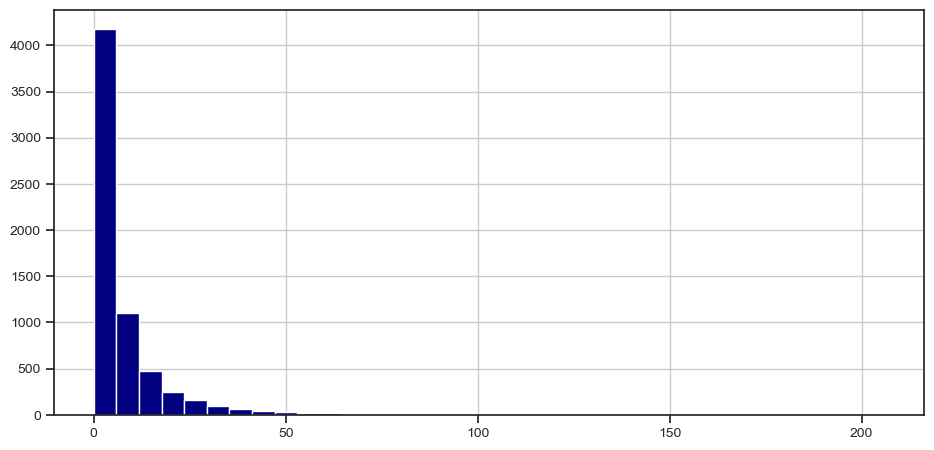

In [260]:
##Target Value- BLK(#Blocks)
#   # Blocks in a season
blk = df['BLK']
blk.hist(figsize=(10,5), bins=35, xlabelsize=10, ylabelsize=10, color = "navy");

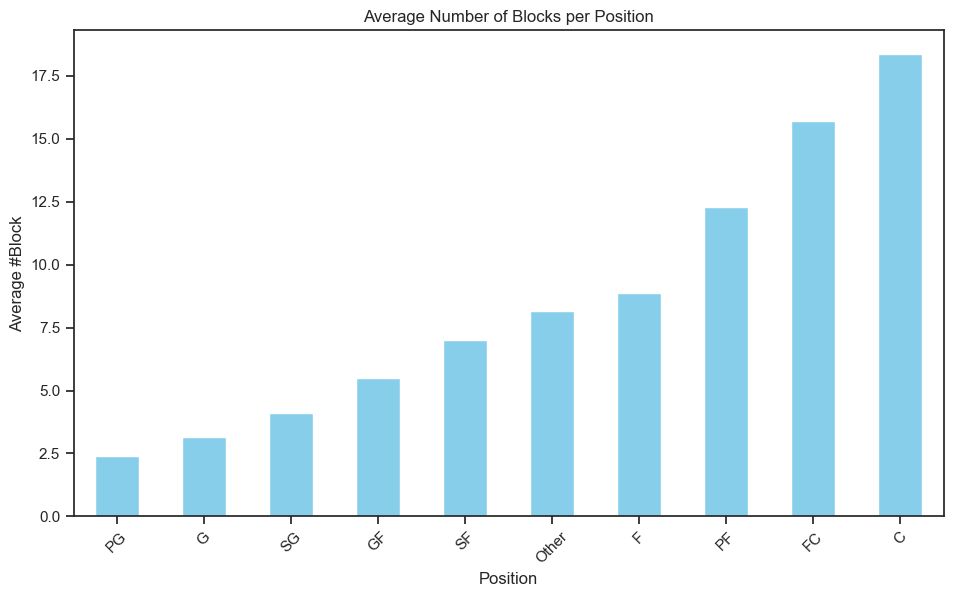

In [261]:
import pandas as pd
import matplotlib.pyplot as plt


# Group by 'position' and calculate the average number of blocks
position_block_avg = df.groupby('position')['BLK'].mean().sort_values()

# Plotting a bar chart
plt.figure(figsize=(10, 6))
position_block_avg.plot(kind='bar', color='skyblue')

plt.title('Average Number of Blocks per Position')
plt.xlabel('Position')
plt.ylabel('Average #Block')
plt.xticks(rotation=45)
plt.show()

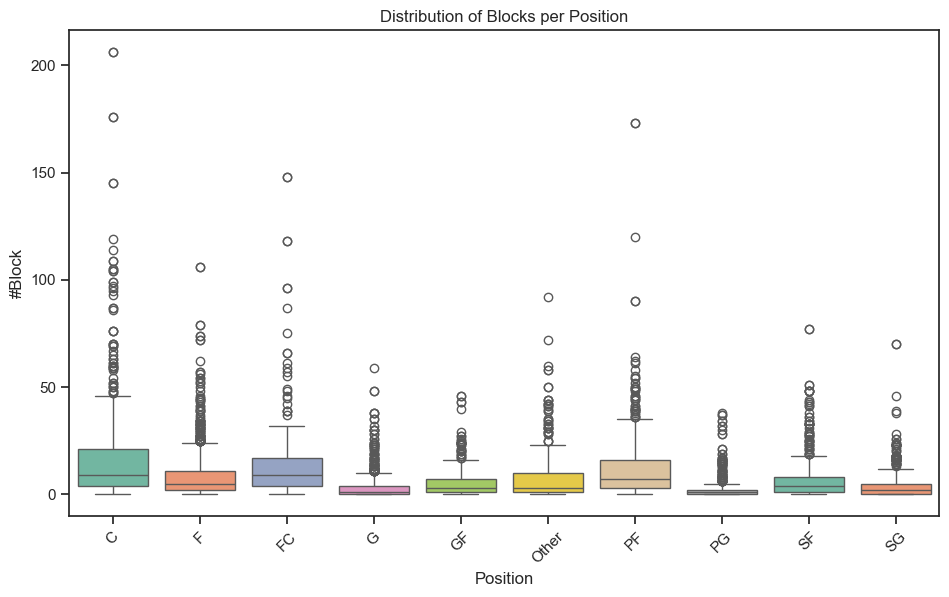

In [262]:
import seaborn as sns


# Plotting a box plot
plt.figure(figsize=(10, 6))
sns.boxplot(x='position', y='BLK', data=df, palette='Set2')

plt.title('Distribution of Blocks per Position')
plt.xlabel('Position')
plt.ylabel('#Block')
plt.xticks(rotation=45)
plt.show()

In [263]:
import scipy.stats as stats

# Perform ANOVA
anova_result = stats.f_oneway(
    *[df[df['position'] == pos]['BLK'].dropna() for pos in df['position'].unique()])


# Display the ANOVA result
print(f"ANOVA F-statistic: {anova_result.statistic}, p-value: {anova_result.pvalue}")

ANOVA F-statistic: 102.26420353764503, p-value: 1.582005458357968e-179


In [264]:
# Correlation
numeric_df = df.loc[:, ~df.columns.isin(['nba_played', 'playoff_played'])].select_dtypes(include=['int','float'])
numeric_df.corr()

,GP,MIN,FGM,FGA,3PM,3PA,FTM,FTA,TOV,PF,ORB,DRB,REB,AST,STL,BLK,PTS,birth_year,height_cm,weight,weight_kg,teams_each_player,leagues_each_player,age
GP,1.000000,0.880385,0.748940,0.762094,0.659049,0.674819,0.606610,0.610978,0.690538,0.866793,0.561936,0.726253,0.709338,0.621619,0.702541,0.536542,0.746294,-0.098619,0.106056,0.127535,0.126849,0.038533,0.301891,0.096803
MIN,0.880385,1.000000,0.918150,0.932363,0.782875,0.803101,0.782786,0.783359,0.851558,0.880516,0.610366,0.847132,0.814766,0.775584,0.836730,0.572664,0.919731,-0.159857,0.075898,0.116209,0.115414,0.033088,0.187347,0.158793
FGM,0.748940,0.918150,1.000000,0.984466,0.734983,0.749113,0.880608,0.883994,0.882170,0.779202,0.632322,0.861941,0.832171,0.762447,0.769629,0.582820,0.992372,-0.137722,0.134639,0.175318,0.174377,0.038384,0.135216,0.137638
FGA,0.762094,0.932363,0.984466,1.000000,0.804974,0.828926,0.870822,0.862766,0.889582,0.775563,0.550516,0.824439,0.780751,0.792642,0.790461,0.522607,0.988215,-0.132949,0.064994,0.107592,0.106592,0.035772,0.124847,0.132733
3PM,0.659049,0.782875,0.734983,0.804974,1.000000,0.986773,0.611166,0.560421,0.651231,0.607873,0.160966,0.531075,0.448671,0.654022,0.651628,0.243914,0.780998,-0.134150,-0.123663,-0.109537,-0.110463,0.007767,0.123462,0.133790
3PA,0.674819,0.803101,0.749113,0.828926,0.986773,1.000000,0.636421,0.589011,0.685733,0.628159,0.175676,0.552360,0.468967,0.684780,0.682030,0.258042,0.794629,-0.124876,-0.132316,-0.115526,-0.116380,0.010052,0.116890,0.124347
FTM,0.606610,0.782786,0.880608,0.870822,0.611166,0.636421,1.000000,0.986910,0.849625,0.665648,0.542584,0.752681,0.723999,0.734926,0.695079,0.498198,0.915415,-0.120305,0.092085,0.130564,0.129274,0.033750,0.128920,0.120818
FTA,0.610978,0.783359,0.883994,0.862766,0.560421,0.589011,0.986910,1.000000,0.855571,0.686504,0.610818,0.789117,0.770806,0.715815,0.694406,0.546526,0.908637,-0.114374,0.138947,0.177607,0.176452,0.040818,0.129492,0.114855
TOV,0.690538,0.851558,0.882170,0.889582,0.651231,0.685733,0.849625,0.855571,1.000000,0.751577,0.522214,0.771222,0.732381,0.872102,0.781346,0.464855,0.890768,-0.117298,0.000233,0.070077,0.069078,0.032974,0.168197,0.117421
PF,0.866793,0.880516,0.779202,0.775563,0.607873,0.628159,0.665648,0.686504,0.751577,1.000000,0.659560,0.790000,0.785135,0.611732,0.740024,0.618957,0.773519,-0.123470,0.180793,0.207584,0.207133,0.037899,0.234166,0.122159


<Axes: >

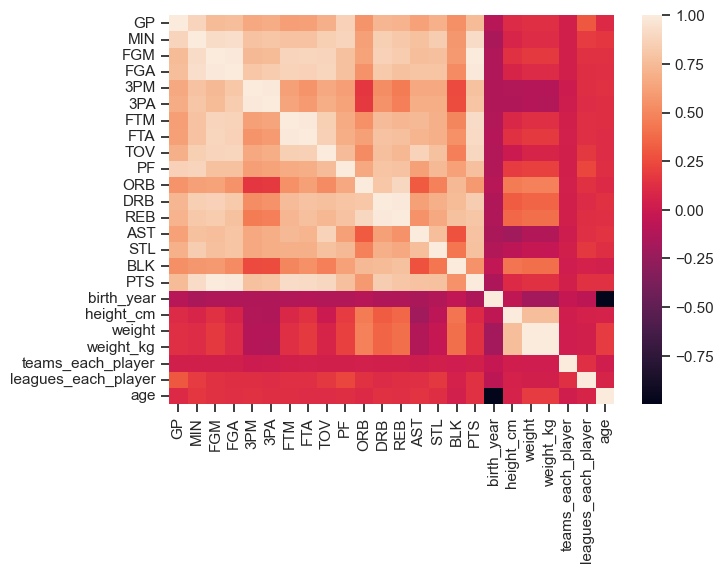

In [265]:
sns.heatmap(numeric_df.corr())

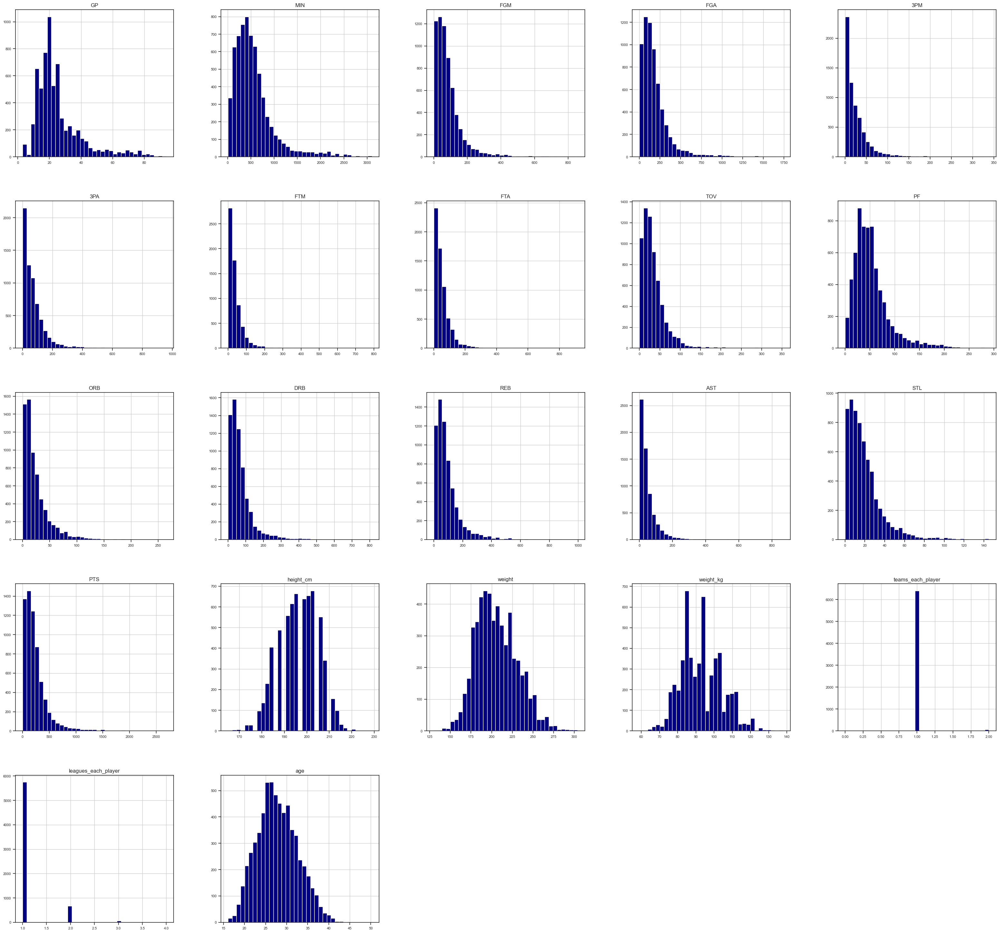

In [302]:
#Histograms for continues numbers
cols= ['GP','MIN','FGM','FGA','3PM','3PA','FTM','FTA','TOV','PF','ORB','DRB','REB','AST','STL','PTS','height_cm','weight','weight_kg','teams_each_player','leagues_each_player'
      ,'age']
con_df = df[cols]
con_df.hist(figsize=(35, 35), bins=35, xlabelsize=8, ylabelsize=8, color = "navy");

## Outliers 

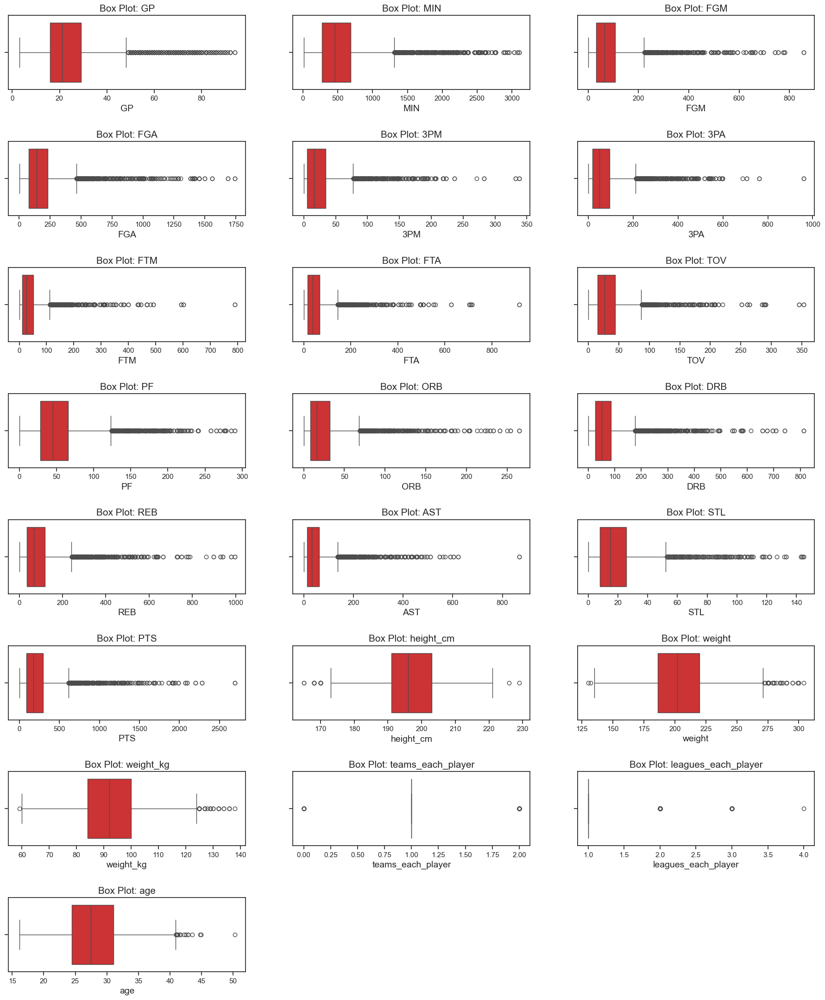

In [267]:
plt.figure(figsize=(20,200))

def outliers_boxplot(df):
    for i, col in enumerate(df.columns):
        
            ax = plt.subplot(60, 3, i+1)
            sb.boxplot(data=df, x=col, ax=ax)
            plt.subplots_adjust(hspace = 0.7)
            plt.title('Box Plot: {}'.format(col), fontsize=15)
            plt.xlabel('{}'.format(col), fontsize=14)
        
outliers_boxplot(con_df)

In [268]:
def outliers_df(df):
    total_outliers = pd.DataFrame(columns=['Outlier count', 'Percent'])

    for col in con_df:  # Ensure processing numeric columns only
        temp = pd.DataFrame(df[col])
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        upper_limit = Q3 + 1.5 * IQR
        lower_limit = Q1 - 1.5 * IQR
        # Filter rows that are outliers in either direction
        temp_outliers = temp[(temp[col] > upper_limit) | (temp[col] < lower_limit)]
        num_outliers = len(temp_outliers)
        total_outliers.loc[col] = [num_outliers, num_outliers / len(df) * 100]

    return total_outliers[total_outliers['Percent'] > 0]

# Assume con_df is your DataFrame
# Call the function and sort results
outliers_df = outliers_df(con_df).sort_values('Percent', ascending=False)
outliers_df

,Outlier count,Percent
leagues_each_player,730.0,11.268910
GP,523.0,8.073479
AST,438.0,6.761346
DRB,422.0,6.514356
REB,419.0,6.468046
ORB,404.0,6.236493
FGA,385.0,5.943192
FGM,381.0,5.881445
MIN,376.0,5.804261
PTS,374.0,5.773387


In [269]:
def outliers(df):
    label_out_df = df.copy()
    for col in label_out_df:
        if col in outliers_df.index:
            Q1 = label_out_df[col].quantile(0.25)
            Q3 = label_out_df[col].quantile(0.75)
            upper_limit = Q1 + 1.5 * (Q3-Q1)
            lower_limit = Q3 - 1.5 * (Q3-Q1)
            label_out_df[col] = np.where(label_out_df[col] > upper_limit,'Outlier',np.where(label_out_df[col] < lower_limit,'Outlier',label_out_df[col]))
    return label_out_df
new_df_outliers = outliers(df)
new_df_outliers.head(10)

,Player,GP,MIN,FGM,FGA,3PM,3PA,FTM,FTA,TOV,PF,ORB,DRB,REB,AST,STL,BLK,PTS,birth_year,birth_month,height_cm,weight,weight_kg,nationality,draft_round,draft_pick,draft_team,nba_played,playoff_played,unique_id,teams_each_player,leagues_each_player,age,position
0,Kelsey Barlow,27,789.4,Outlier,Outlier,Outlier,Outlier,Outlier,Outlier,55,74,19,103,122,Outlier,Outlier,14,Outlier,1991.0,Feb,196.0,200.0,91.0,United States,NaN,NaN,nan,0,0,fefc9789e91e4fc3b9b3e97506417ab2,1,1,29.51403148528405,GF
1,Anthony Young,25,806.6,Outlier,Outlier,Outlier,125,Outlier,Outlier,34,59,18,Outlier,141,50,20,10,Outlier,1989.0,Dec,201.0,Outlier,Outlier,United States,NaN,NaN,nan,0,0,6354c53dfc7f4835a8215d86cc95be6c,1,1,31.69404517453799,C
2,Pedro Barral,25,759.8,Outlier,Outlier,33,93,Outlier,Outlier,Outlier,52,13,84,97,Outlier,24,0,Outlier,1994.0,Oct,185.0,175.0,79.0,Argentina,NaN,NaN,nan,0,0,8ea081fb36ef4fd4a4698817ea5f66b4,1,1,26.83436002737851,PG
3,Federico Mariani,24,856.3,120,277,44,112,Outlier,Outlier,55,36,13,69,82,67,15,2,Outlier,1992.0,Apr,191.0,nan,nan,Argentina,NaN,NaN,nan,0,0,906da9fbdb0648d8affdb0c40005e87c,1,1,28.350444900752912,F
4,Caio De Souza Pacheco,21,582.7,134,296,30,104,Outlier,Outlier,Outlier,49,7,59,66,Outlier,17,2,Outlier,1999.0,Feb,188.0,190.0,86.0,Brazil,NaN,NaN,nan,0,0,cc33d7c5addd4e508aec7c7c4c3fac89,1,1,21.492128678986994,Other
5,Jonatan Slider,26,832.7,118,295,Outlier,Outlier,Outlier,Outlier,40,81,25,Outlier,151,45,Outlier,3,Outlier,1987.0,Jul,193.0,195.0,88.0,Argentina,NaN,NaN,nan,0,0,1732195ad61b4920831386fcc2ef4553,1,1,33.06776180698152,SG
6,Martin Cuello,22,689.9,Outlier,286,Outlier,107,38,43,22,44,19,34,53,75,23,4,402,1993.0,Mar,196.0,205.0,93.0,Argentina,NaN,NaN,nan,0,0,ad3548e4ac394a2989e3a48bbedfea7b,1,1,27.44147843942505,G
7,Patricio Tabarez,27,852.7,119,291,Outlier,Outlier,Outlier,Outlier,Outlier,80,20,102,122,79,Outlier,23,387,1991.0,Jun,196.0,nan,nan,Argentina,NaN,NaN,nan,0,0,d6bd87cc4854442181c5bb4dcd4ca129,1,1,29.152635181382614,F
8,Brandon Robinson,21,551.3,130,270,35,105,Outlier,Outlier,42,44,10,43,53,57,18,8,385,1989.0,Mar,196.0,185.0,84.0,United States,NaN,NaN,nan,0,0,929b54d2d35941b5b6894965881f3267,1,1,31.40588637919233,GF
9,Trevor Gaskins,22,666.0,122,287,Outlier,Outlier,66,74,37,68,8,60,68,53,14,0,377,1989.0,Nov,188.0,215.0,98.0,Two Nationalities,NaN,NaN,nan,0,0,52874b9ed1fe48499b2f280ed334a002,1,1,31.737850787132103,G


In [270]:
df_outliers = new_df_outliers.isin(['Outlier']) 
df_outliers = df_outliers.astype('int')
df_outliers

,Player,GP,MIN,FGM,FGA,3PM,3PA,FTM,FTA,TOV,PF,ORB,DRB,REB,AST,STL,BLK,PTS,birth_year,birth_month,height_cm,weight,weight_kg,nationality,draft_round,draft_pick,draft_team,nba_played,playoff_played,unique_id,teams_each_player,leagues_each_player,age,position
0,0,0,0,1,1,1,1,1,1,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,1,1,1,0,1,1,0,0,0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,1,1,0,0,1,1,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,1,1,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6473,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0
6474,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6475,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6476,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [271]:
def capping(df):
    temp = df.copy()
    for col in temp:
        if col in outliers_df.index:
            Q1 = temp[col].quantile(0.25)
            Q3 = temp[col].quantile(0.75)
            upper_limit = Q1 + 1.5 * (Q3-Q1)
            lower_limit = Q3 - 1.5 * (Q3-Q1)
            temp[col] = np.where(temp[col] > upper_limit,np.nan,np.where(temp[col] < lower_limit,np.nan,temp[col]))
    return temp
temp = capping(df)
temp

,Player,GP,MIN,FGM,FGA,3PM,3PA,FTM,FTA,TOV,PF,ORB,DRB,REB,AST,STL,BLK,PTS,birth_year,birth_month,height_cm,weight,weight_kg,nationality,draft_round,draft_pick,draft_team,nba_played,playoff_played,unique_id,teams_each_player,leagues_each_player,age,position
0,Kelsey Barlow,27.0,789.4,NaN,NaN,NaN,NaN,NaN,NaN,55.0,74.0,19.0,103.0,122.0,NaN,NaN,14,NaN,1991.0,Feb,196.0,200.0,91.0,United States,NaN,NaN,nan,0,0,fefc9789e91e4fc3b9b3e97506417ab2,1.0,1.0,29.514031,GF
1,Anthony Young,25.0,806.6,NaN,NaN,NaN,125.0,NaN,NaN,34.0,59.0,18.0,NaN,141.0,50.0,20.0,10,NaN,1989.0,Dec,201.0,NaN,NaN,United States,NaN,NaN,nan,0,0,6354c53dfc7f4835a8215d86cc95be6c,1.0,1.0,31.694045,C
2,Pedro Barral,25.0,759.8,NaN,NaN,33.0,93.0,NaN,NaN,NaN,52.0,13.0,84.0,97.0,NaN,24.0,0,NaN,1994.0,Oct,185.0,175.0,79.0,Argentina,NaN,NaN,nan,0,0,8ea081fb36ef4fd4a4698817ea5f66b4,1.0,1.0,26.834360,PG
3,Federico Mariani,24.0,856.3,120.0,277.0,44.0,112.0,NaN,NaN,55.0,36.0,13.0,69.0,82.0,67.0,15.0,2,NaN,1992.0,Apr,191.0,NaN,NaN,Argentina,NaN,NaN,nan,0,0,906da9fbdb0648d8affdb0c40005e87c,1.0,1.0,28.350445,F
4,Caio De Souza Pacheco,21.0,582.7,134.0,296.0,30.0,104.0,NaN,NaN,NaN,49.0,7.0,59.0,66.0,NaN,17.0,2,NaN,1999.0,Feb,188.0,190.0,86.0,Brazil,NaN,NaN,nan,0,0,cc33d7c5addd4e508aec7c7c4c3fac89,1.0,1.0,21.492129,Other
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6473,Anuar Rahimshaikov,13.0,91.6,8.0,17.0,0.0,2.0,5.0,5.0,4.0,10.0,1.0,6.0,7.0,4.0,4.0,0,21.0,1997.0,Mar,188.0,NaN,NaN,Ukraine,NaN,NaN,nan,0,0,46ae1416450d417f87b313b087864547,1.0,1.0,23.405886,SG
6474,Kyrylo Meshheryakov,15.0,127.0,7.0,28.0,2.0,13.0,3.0,4.0,5.0,27.0,4.0,14.0,18.0,8.0,1.0,3,19.0,1995.0,Aug,198.0,182.0,83.0,Ukraine,NaN,NaN,nan,0,0,9495d3ff0f6649fb92fdc98863e7a6ad,1.0,1.0,25.010267,F
6475,Yaroslav Kadygrob,10.0,81.7,5.0,16.0,4.0,14.0,1.0,3.0,3.0,NaN,2.0,4.0,6.0,3.0,0.0,0,15.0,1991.0,Oct,191.0,187.0,85.0,Ukraine,NaN,NaN,nan,0,0,21c3d427035f4c96b2eed4c4ddc8acd5,1.0,1.0,29.813142,G
6476,Ernesto Tkachuk,16.0,124.7,1.0,15.0,0.0,11.0,7.0,14.0,11.0,12.0,0.0,15.0,15.0,10.0,6.0,1,9.0,1994.0,Sep,188.0,200.0,91.0,Ukraine,NaN,NaN,nan,0,0,c98a3ecd9078448a98a0f3097ef785c6,1.0,1.0,26.924709,PG


In [272]:
### differences between two correlation in Python: https://github.com/psinger/CorrelationStats
### We will only take from the code the Fisher method for two-tailed test
def cocor(x1,y1, x2,y2):
    xy1 = x1.corr(y1, method='spearman')
    xy2 = x2.corr(y2, method='spearman')
    n1 = len(x1)
    n2 = len(x2)
    xy_z = 0.5 * np.log((1 + xy1)/(1 - xy1))
    ab_z = 0.5 * np.log((1 + xy2)/(1 - xy2))
    if n2 is None:
        n2 = n1
    se_diff_r = np.sqrt(1/(n1 - 3) + 1/(n2 - 3))
    diff = xy_z - ab_z
    z = abs(diff / se_diff_r)
    p = (1 - norm.cdf(z)) * 2
    return z, p

In [273]:
from scipy.stats import norm
from scipy.stats import ks_2samp

c=con_df
names=c.columns
#Creating df that reflects the correlation change
out_df= pd.DataFrame(columns=['feature','outliers_cnt','distribution_changed','correlation_changed'])

#A copy of numeric df
no_outliers=con_df.copy()
np.seterr(divide='ignore', invalid='ignore')
for i in names:
#   print(i)
#     df with outliers
    out=df[i]
#     df with out outliers
    non=df[i].loc[df_outliers[i]==0]
#     lable with outliers
    survived_out=df['BLK']
#     lable with out outliers
    survived_non=df['BLK'].loc[df_outliers[i]==0]
#     cocor pvalue
    p, pvalue = cocor(out,survived_out, non,survived_non)
    cor_change=np.where(pvalue<0.05,'+','-')
#     outliers count
    mv=df_outliers.sum()
#    ks pvalue
    pval=ks_2samp(out, non)[1]
    dist_change=np.where(pval<0.05,'+','-')
    new_row = pd.DataFrame([{
    'feature': i,
    'outliers_cnt': mv,
    'distribution_changed': dist_change,
    'correlation_changed': cor_change
}])

# Use pd.concat to append the new row to out_df
    out_df = pd.concat([out_df, new_row], ignore_index=True)    
##out_df=out_df.append({'feature':i,'outliers_cnt':mv,'distribution_changed':dist_change,'correlation_changed': cor_change},ignore_index=True)
out_df

,feature,outliers_cnt,distribution_changed,correlation_changed
0,GP,Player 0 GP 1269 MIN 1045 FGM 906 FGA 914 3PM 911 3PA 904 FTM 931 FTA 960 TOV 945 PF 1055 ORB 950 DRB 956 REB 955 AST 1036 STL 936 BLK 0 PTS 905 birth_year 0 birth_month 0 height_cm 846 weight 864 weight_kg 808 nationality 0 draft_round 0 draft_pick 0 draft_team 0 nba_played 0 playoff_played 0 unique_id 0 teams_each_player 79 leagues_each_player 730 age 1121 position 0 dtype: int64,+,+
1,MIN,Player 0 GP 1269 MIN 1045 FGM 906 FGA 914 3PM 911 3PA 904 FTM 931 FTA 960 TOV 945 PF 1055 ORB 950 DRB 956 REB 955 AST 1036 STL 936 BLK 0 PTS 905 birth_year 0 birth_month 0 height_cm 846 weight 864 weight_kg 808 nationality 0 draft_round 0 draft_pick 0 draft_team 0 nba_played 0 playoff_played 0 unique_id 0 teams_each_player 79 leagues_each_player 730 age 1121 position 0 dtype: int64,+,+
2,FGM,Player 0 GP 1269 MIN 1045 FGM 906 FGA 914 3PM 911 3PA 904 FTM 931 FTA 960 TOV 945 PF 1055 ORB 950 DRB 956 REB 955 AST 1036 STL 936 BLK 0 PTS 905 birth_year 0 birth_month 0 height_cm 846 weight 864 weight_kg 808 nationality 0 draft_round 0 draft_pick 0 draft_team 0 nba_played 0 playoff_played 0 unique_id 0 teams_each_player 79 leagues_each_player 730 age 1121 position 0 dtype: int64,+,+
3,FGA,Player 0 GP 1269 MIN 1045 FGM 906 FGA 914 3PM 911 3PA 904 FTM 931 FTA 960 TOV 945 PF 1055 ORB 950 DRB 956 REB 955 AST 1036 STL 936 BLK 0 PTS 905 birth_year 0 birth_month 0 height_cm 846 weight 864 weight_kg 808 nationality 0 draft_round 0 draft_pick 0 draft_team 0 nba_played 0 playoff_played 0 unique_id 0 teams_each_player 79 leagues_each_player 730 age 1121 position 0 dtype: int64,+,+
4,3PM,Player 0 GP 1269 MIN 1045 FGM 906 FGA 914 3PM 911 3PA 904 FTM 931 FTA 960 TOV 945 PF 1055 ORB 950 DRB 956 REB 955 AST 1036 STL 936 BLK 0 PTS 905 birth_year 0 birth_month 0 height_cm 846 weight 864 weight_kg 808 nationality 0 draft_round 0 draft_pick 0 draft_team 0 nba_played 0 playoff_played 0 unique_id 0 teams_each_player 79 leagues_each_player 730 age 1121 position 0 dtype: int64,+,+
5,3PA,Player 0 GP 1269 MIN 1045 FGM 906 FGA 914 3PM 911 3PA 904 FTM 931 FTA 960 TOV 945 PF 1055 ORB 950 DRB 956 REB 955 AST 1036 STL 936 BLK 0 PTS 905 birth_year 0 birth_month 0 height_cm 846 weight 864 weight_kg 808 nationality 0 draft_round 0 draft_pick 0 draft_team 0 nba_played 0 playoff_played 0 unique_id 0 teams_each_player 79 leagues_each_player 730 age 1121 position 0 dtype: int64,+,+
6,FTM,Player 0 GP 1269 MIN 1045 FGM 906 FGA 914 3PM 911 3PA 904 FTM 931 FTA 960 TOV 945 PF 1055 ORB 950 DRB 956 REB 955 AST 1036 STL 936 BLK 0 PTS 905 birth_year 0 birth_month 0 height_cm 846 weight 864 weight_kg 808 nationality 0 draft_round 0 draft_pick 0 draft_team 0 nba_played 0 playoff_played 0 unique_id 0 teams_each_player 79 leagues_each_player 730 age 1121 position 0 dtype: int64,+,+
7,FTA,Player 0 GP 1269 MIN 1045 FGM 906 FGA 914 3PM 911 3PA 904 FTM 931 FTA 960 TOV 945 PF 1055 ORB 950 DRB 956 REB 955 AST 1036 STL 936 BLK 0 PTS 905 birth_year 0 birth_month 0 height_cm 846 weight 864 weight_kg 808 nationality 0 draft_round 0 draft_pick 0 draft_team 0 nba_played 0 playoff_played 0 unique_id 0 teams_each_player 79 leagues_each_player 730 age 1121 position 0 dtype: int64,+,+
8,TOV,Player 0 GP 1269 MIN 1045 FGM 906 FGA 914 3PM 911 3PA 904 FTM 931 FTA 960 TOV 945 PF 1055 ORB 950 DRB 956 REB 955 AST 1036 STL 936 BLK 0 PTS 905 birth_year 0 birth_month 0 height_cm 846 weight 864 weight_kg 808 nationality 0 draft_round 0 draft_pick 0 draft_team 0 nba_played 0 playoff_played 0 unique_id 0 teams_each_player 79 leagues_each_player 730 age 1121 position 0 dtype: int64,+,+
9,PF,Player 0 GP 1269 MIN 1045 FGM 906 FGA 914 3PM 911 3PA 904 FTM 931 FTA 960 TOV 945 PF 1055 ORB 950 DRB 956 REB 955 AST 1036 STL 936 BLK 0 PTS 905 birth_year 0 birth_month 0 height_cm 846 weight 864 weight_kg 808 nationality 0 draft_round 0 draft_pick 0 draft_team 0 nba_played 0 playoff_played 0 unique_id 0 teams_each_player 79 leagues_each_player 730 age 1121 position 0 dtype:

In [274]:
#All 'Yes' Vars in the 'Drop'colums shall be deleted, since the infect correlation and distribution. 
#We don't want to delete vars that will change both corr only
out_df['drop']='yes'
out_df.loc[(out_df.distribution_changed=='+')& (out_df.correlation_changed=='+'),'drop'] = 'no'
out_df

,feature,outliers_cnt,distribution_changed,correlation_changed,drop
0,GP,Player 0 GP 1269 MIN 1045 FGM 906 FGA 914 3PM 911 3PA 904 FTM 931 FTA 960 TOV 945 PF 1055 ORB 950 DRB 956 REB 955 AST 1036 STL 936 BLK 0 PTS 905 birth_year 0 birth_month 0 height_cm 846 weight 864 weight_kg 808 nationality 0 draft_round 0 draft_pick 0 draft_team 0 nba_played 0 playoff_played 0 unique_id 0 teams_each_player 79 leagues_each_player 730 age 1121 position 0 dtype: int64,+,+,no
1,MIN,Player 0 GP 1269 MIN 1045 FGM 906 FGA 914 3PM 911 3PA 904 FTM 931 FTA 960 TOV 945 PF 1055 ORB 950 DRB 956 REB 955 AST 1036 STL 936 BLK 0 PTS 905 birth_year 0 birth_month 0 height_cm 846 weight 864 weight_kg 808 nationality 0 draft_round 0 draft_pick 0 draft_team 0 nba_played 0 playoff_played 0 unique_id 0 teams_each_player 79 leagues_each_player 730 age 1121 position 0 dtype: int64,+,+,no
2,FGM,Player 0 GP 1269 MIN 1045 FGM 906 FGA 914 3PM 911 3PA 904 FTM 931 FTA 960 TOV 945 PF 1055 ORB 950 DRB 956 REB 955 AST 1036 STL 936 BLK 0 PTS 905 birth_year 0 birth_month 0 height_cm 846 weight 864 weight_kg 808 nationality 0 draft_round 0 draft_pick 0 draft_team 0 nba_played 0 playoff_played 0 unique_id 0 teams_each_player 79 leagues_each_player 730 age 1121 position 0 dtype: int64,+,+,no
3,FGA,Player 0 GP 1269 MIN 1045 FGM 906 FGA 914 3PM 911 3PA 904 FTM 931 FTA 960 TOV 945 PF 1055 ORB 950 DRB 956 REB 955 AST 1036 STL 936 BLK 0 PTS 905 birth_year 0 birth_month 0 height_cm 846 weight 864 weight_kg 808 nationality 0 draft_round 0 draft_pick 0 draft_team 0 nba_played 0 playoff_played 0 unique_id 0 teams_each_player 79 leagues_each_player 730 age 1121 position 0 dtype: int64,+,+,no
4,3PM,Player 0 GP 1269 MIN 1045 FGM 906 FGA 914 3PM 911 3PA 904 FTM 931 FTA 960 TOV 945 PF 1055 ORB 950 DRB 956 REB 955 AST 1036 STL 936 BLK 0 PTS 905 birth_year 0 birth_month 0 height_cm 846 weight 864 weight_kg 808 nationality 0 draft_round 0 draft_pick 0 draft_team 0 nba_played 0 playoff_played 0 unique_id 0 teams_each_player 79 leagues_each_player 730 age 1121 position 0 dtype: int64,+,+,no
5,3PA,Player 0 GP 1269 MIN 1045 FGM 906 FGA 914 3PM 911 3PA 904 FTM 931 FTA 960 TOV 945 PF 1055 ORB 950 DRB 956 REB 955 AST 1036 STL 936 BLK 0 PTS 905 birth_year 0 birth_month 0 height_cm 846 weight 864 weight_kg 808 nationality 0 draft_round 0 draft_pick 0 draft_team 0 nba_played 0 playoff_played 0 unique_id 0 teams_each_player 79 leagues_each_player 730 age 1121 position 0 dtype: int64,+,+,no
6,FTM,Player 0 GP 1269 MIN 1045 FGM 906 FGA 914 3PM 911 3PA 904 FTM 931 FTA 960 TOV 945 PF 1055 ORB 950 DRB 956 REB 955 AST 1036 STL 936 BLK 0 PTS 905 birth_year 0 birth_month 0 height_cm 846 weight 864 weight_kg 808 nationality 0 draft_round 0 draft_pick 0 draft_team 0 nba_played 0 playoff_played 0 unique_id 0 teams_each_player 79 leagues_each_player 730 age 1121 position 0 dtype: int64,+,+,no
7,FTA,Player 0 GP 1269 MIN 1045 FGM 906 FGA 914 3PM 911 3PA 904 FTM 931 FTA 960 TOV 945 PF 1055 ORB 950 DRB 956 REB 955 AST 1036 STL 936 BLK 0 PTS 905 birth_year 0 birth_month 0 height_cm 846 weight 864 weight_kg 808 nationality 0 draft_round 0 draft_pick 0 draft_team 0 nba_played 0 playoff_played 0 unique_id 0 teams_each_player 79 leagues_each_player 730 age 1121 position 0 dtype: int64,+,+,no
8,TOV,Player 0 GP 1269 MIN 1045 FGM 906 FGA 914 3PM 911 3PA 904 FTM 931 FTA 960 TOV 945 PF 1055 ORB 950 DRB 956 REB 955 AST 1036 STL 936 BLK 0 PTS 905 birth_year 0 birth_month 0 height_cm 846 weight 864 weight_kg 808 nationality 0 draft_round 0 draft_pick 0 draft_team 0 nba_played 0 playoff_played 0 unique_id 0 teams_each_player 79 leagues_each_player 730 age 1121 position 0 dtype: int64,+,+,no
9,PF,Player 0 GP 1269 MIN 1045 FGM 906 FGA 914 3PM 911 3PA 904 FTM 931 FTA 960 TOV 945 PF 1055 ORB 950 DRB 956 REB 955 AST 1036 STL 936 BLK 0 PTS 905 birth_year 0 birth_month 0 height_cm 846 weight 864 weight_kg 808 nationality 0 draft_round 0 draft_pick 0 draft_team 0 nba_played 0 playoff_played 0 unique_id 0 teams_each_player 79 leagues_each_playe

In [275]:
# Getting relevant columns and features
relevant_columns=out_df.loc[out_df['drop']=='yes']
relevant_columns

,feature,outliers_cnt,distribution_changed,correlation_changed,drop
13,AST,Player 0 GP 1269 MIN 1045 FGM 906 FGA 914 3PM 911 3PA 904 FTM 931 FTA 960 TOV 945 PF 1055 ORB 950 DRB 956 REB 955 AST 1036 STL 936 BLK 0 PTS 905 birth_year 0 birth_month 0 height_cm 846 weight 864 weight_kg 808 nationality 0 draft_round 0 draft_pick 0 draft_team 0 nba_played 0 playoff_played 0 unique_id 0 teams_each_player 79 leagues_each_player 730 age 1121 position 0 dtype: int64,+,-,yes
16,height_cm,Player 0 GP 1269 MIN 1045 FGM 906 FGA 914 3PM 911 3PA 904 FTM 931 FTA 960 TOV 945 PF 1055 ORB 950 DRB 956 REB 955 AST 1036 STL 936 BLK 0 PTS 905 birth_year 0 birth_month 0 height_cm 846 weight 864 weight_kg 808 nationality 0 draft_round 0 draft_pick 0 draft_team 0 nba_played 0 playoff_played 0 unique_id 0 teams_each_player 79 leagues_each_player 730 age 1121 position 0 dtype: int64,-,+,yes
17,weight,Player 0 GP 1269 MIN 1045 FGM 906 FGA 914 3PM 911 3PA 904 FTM 931 FTA 960 TOV 945 PF 1055 ORB 950 DRB 956 REB 955 AST 1036 STL 936 BLK 0 PTS 905 birth_year 0 birth_month 0 height_cm 846 weight 864 weight_kg 808 nationality 0 draft_round 0 draft_pick 0 draft_team 0 nba_played 0 playoff_played 0 unique_id 0 teams_each_player 79 leagues_each_player 730 age 1121 position 0 dtype: int64,-,+,yes
18,weight_kg,Player 0 GP 1269 MIN 1045 FGM 906 FGA 914 3PM 911 3PA 904 FTM 931 FTA 960 TOV 945 PF 1055 ORB 950 DRB 956 REB 955 AST 1036 STL 936 BLK 0 PTS 905 birth_year 0 birth_month 0 height_cm 846 weight 864 weight_kg 808 nationality 0 draft_round 0 draft_pick 0 draft_team 0 nba_played 0 playoff_played 0 unique_id 0 teams_each_player 79 leagues_each_player 730 age 1121 position 0 dtype: int64,-,+,yes
19,teams_each_player,Player 0 GP 1269 MIN 1045 FGM 906 FGA 914 3PM 911 3PA 904 FTM 931 FTA 960 TOV 945 PF 1055 ORB 950 DRB 956 REB 955 AST 1036 STL 936 BLK 0 PTS 905 birth_year 0 birth_month 0 height_cm 846 weight 864 weight_kg 808 nationality 0 draft_round 0 draft_pick 0 draft_team 0 nba_played 0 playoff_played 0 unique_id 0 teams_each_player 79 leagues_each_player 730 age 1121 position 0 dtype: int64,-,-,yes
20,leagues_each_player,Player 0 GP 1269 MIN 1045 FGM 906 FGA 914 3PM 911 3PA 904 FTM 931 FTA 960 TOV 945 PF 1055 ORB 950 DRB 956 REB 955 AST 1036 STL 936 BLK 0 PTS 905 birth_year 0 birth_month 0 height_cm 846 weight 864 weight_kg 808 nationality 0 draft_round 0 draft_pick 0 draft_team 0 nba_played 0 playoff_played 0 unique_id 0 teams_each_player 79 leagues_each_player 730 age 1121 position 0 dtype: int64,+,-,yes
21,age,Player 0 GP 1269 MIN 1045 FGM 906 FGA 914 3PM 911 3PA 904 FTM 931 FTA 960 TOV 945 PF 1055 ORB 950 DRB 956 REB 955 AST 1036 STL 936 BLK 0 PTS 905 birth_year 0 birth_month 0 height_cm 846 weight 864 weight_kg 808 nationality 0 draft_round 0 draft_pick 0 draft_team 0 nba_played 0 playoff_played 0 unique_id 0 teams_each_player 79 leagues_each_player 730 age 1121 position 0 dtype: int64,-,+,yes


In [276]:
# Getting relevant columns and features
relevant_columns_features=out_df.loc[out_df['drop']=='yes']['feature']
relevant_columns_features

13                    AST
16              height_cm
17                 weight
18              weight_kg
19      teams_each_player
20    leagues_each_player
21                    age
Name: feature, dtype: object

In [277]:
# List of outlier columns to remove
remove_outliers=['AST','height_cm','weight','weight_kg','teams_each_player','leagues_each_player','age']
remove_outliers

['AST',
 'height_cm',
 'weight',
 'weight_kg',
 'teams_each_player',
 'leagues_each_player',
 'age']

In [278]:
#Checking to see the outlier = yes on manipulated data is gone on df
for col in remove_outliers:
    if manipulated_data.loc[df[col] == 'yes'].empty:
        print(f"The {col} column is empty")
    else:
        print(f"The {col} column has not empty") 

The AST column is empty
The height_cm column is empty
The weight column is empty
The weight_kg column is empty
The teams_each_player column is empty
The leagues_each_player column is empty
The age column is empty


In [279]:
# Copying and manipulating data based on outliers
manipulated_data= df.copy()
for j in range(len(df)):
    for col in remove_outliers:
        if df_outliers.loc[j,col] == 1:
            manipulated_data.loc[j,col]= np.nan

df_cleaned = manipulated_data
df_cleaned
#new_df_outliers[new_df_outliers['Player']=='Kelsey Barlow']

,Player,GP,MIN,FGM,FGA,3PM,3PA,FTM,FTA,TOV,PF,ORB,DRB,REB,AST,STL,BLK,PTS,birth_year,birth_month,height_cm,weight,weight_kg,nationality,draft_round,draft_pick,draft_team,nba_played,playoff_played,unique_id,teams_each_player,leagues_each_player,age,position
0,Kelsey Barlow,27,789.4,179,414,68,203,81,98,55,74,19,103,122,NaN,45,14,507,1991.0,Feb,196.0,200.0,91.0,United States,NaN,NaN,nan,0,0,fefc9789e91e4fc3b9b3e97506417ab2,1.0,1.0,29.514031,GF
1,Anthony Young,25,806.6,160,329,51,125,92,108,34,59,18,123,141,50.0,20,10,463,1989.0,Dec,201.0,NaN,NaN,United States,NaN,NaN,nan,0,0,6354c53dfc7f4835a8215d86cc95be6c,1.0,1.0,31.694045,C
2,Pedro Barral,25,759.8,153,331,33,93,102,131,78,52,13,84,97,NaN,24,0,441,1994.0,Oct,185.0,175.0,79.0,Argentina,NaN,NaN,nan,0,0,8ea081fb36ef4fd4a4698817ea5f66b4,1.0,1.0,26.834360,PG
3,Federico Mariani,24,856.3,120,277,44,112,135,151,55,36,13,69,82,67.0,15,2,419,1992.0,Apr,191.0,NaN,NaN,Argentina,NaN,NaN,nan,0,0,906da9fbdb0648d8affdb0c40005e87c,1.0,1.0,28.350445,F
4,Caio De Souza Pacheco,21,582.7,134,296,30,104,110,145,72,49,7,59,66,NaN,17,2,408,1999.0,Feb,188.0,190.0,86.0,Brazil,NaN,NaN,nan,0,0,cc33d7c5addd4e508aec7c7c4c3fac89,1.0,1.0,21.492129,Other
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6473,Anuar Rahimshaikov,13,91.6,8,17,0,2,5,5,4,10,1,6,7,4.0,4,0,21,1997.0,Mar,188.0,NaN,NaN,Ukraine,NaN,NaN,nan,0,0,46ae1416450d417f87b313b087864547,1.0,1.0,23.405886,SG
6474,Kyrylo Meshheryakov,15,127.0,7,28,2,13,3,4,5,27,4,14,18,8.0,1,3,19,1995.0,Aug,198.0,182.0,83.0,Ukraine,NaN,NaN,nan,0,0,9495d3ff0f6649fb92fdc98863e7a6ad,1.0,1.0,25.010267,F
6475,Yaroslav Kadygrob,10,81.7,5,16,4,14,1,3,3,2,2,4,6,3.0,0,0,15,1991.0,Oct,191.0,187.0,85.0,Ukraine,NaN,NaN,nan,0,0,21c3d427035f4c96b2eed4c4ddc8acd5,1.0,1.0,29.813142,G
6476,Ernesto Tkachuk,16,124.7,1,15,0,11,7,14,11,12,0,15,15,10.0,6,1,9,1994.0,Sep,188.0,200.0,91.0,Ukraine,NaN,NaN,nan,0,0,c98a3ecd9078448a98a0f3097ef785c6,1.0,1.0,26.924709,PG


## Missing Values

<Axes: >

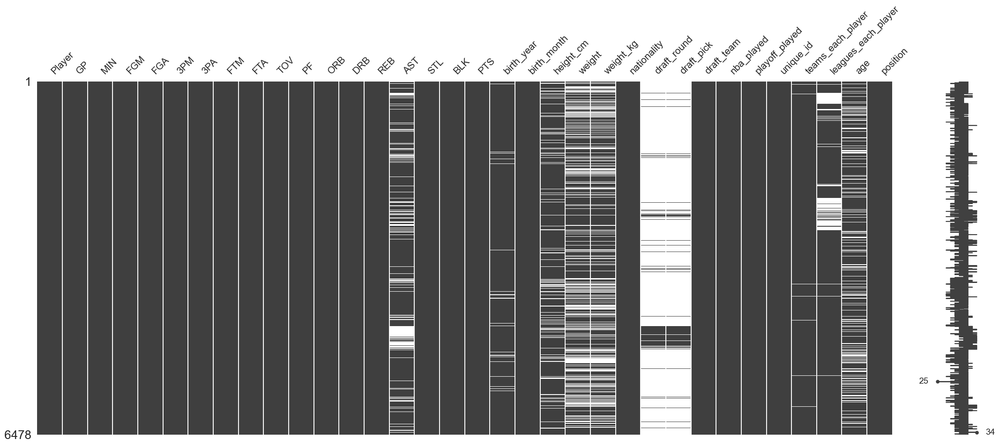

In [280]:
import missingno as msno
msno.matrix(df_cleaned)

In [281]:
df_nulls = df_cleaned.copy()
for col in df_nulls:
    if df_nulls[col].isna().sum() == 0:
        del df_nulls[col]
df_nulls

,AST,birth_year,height_cm,weight,weight_kg,draft_round,draft_pick,teams_each_player,leagues_each_player,age
0,NaN,1991.0,196.0,200.0,91.0,NaN,NaN,1.0,1.0,29.514031
1,50.0,1989.0,201.0,NaN,NaN,NaN,NaN,1.0,1.0,31.694045
2,NaN,1994.0,185.0,175.0,79.0,NaN,NaN,1.0,1.0,26.834360
3,67.0,1992.0,191.0,NaN,NaN,NaN,NaN,1.0,1.0,28.350445
4,NaN,1999.0,188.0,190.0,86.0,NaN,NaN,1.0,1.0,21.492129
...,...,...,...,...,...,...,...,...,...,...
6473,4.0,1997.0,188.0,NaN,NaN,NaN,NaN,1.0,1.0,23.405886
6474,8.0,1995.0,198.0,182.0,83.0,NaN,NaN,1.0,1.0,25.010267
6475,3.0,1991.0,191.0,187.0,85.0,NaN,NaN,1.0,1.0,29.813142
6476,10.0,1994.0,188.0,200.0,91.0,NaN,NaN,1.0,1.0,26.924709


In [282]:
# Calculate the percentage of missing values in each column
missing_percentage = df_nulls.isnull().mean() * 100

# Display the missing percentages
missing_percentage = missing_percentage.reset_index()
missing_percentage.columns = ['Column', 'Missing Percentage']
missing_percentage

,Column,Missing Percentage
0,AST,15.992590
1,birth_year,2.161161
2,height_cm,13.615313
3,weight,31.182464
4,weight_kg,30.317999
5,draft_round,90.984872
6,draft_pick,90.984872
7,teams_each_player,1.219512
8,leagues_each_player,11.268910
9,age,19.465885


If cases that columns has less than 60% missing- we could consider using the null as an additional category:<br>
Ex - df['deck'] = df['deck'].fillna('H')<br>
In cases we have coulumns with +- 80% missing, we will remove it

In [283]:
del df_cleaned['draft_round']
del df_cleaned['draft_pick']

# Imputation with KNN

In [284]:
from sklearn.impute import KNNImputer
final_df = df_cleaned.copy()
imp_cols = final_df.select_dtypes(include = ['float64', 'int64']).columns
knn_imputer = KNNImputer(n_neighbors=1)
imputed_data = pd.DataFrame(knn_imputer.fit_transform(final_df[imp_cols]),columns = imp_cols)

In [285]:
final_df[imp_cols] = imputed_data
final_df

,Player,GP,MIN,FGM,FGA,3PM,3PA,FTM,FTA,TOV,PF,ORB,DRB,REB,AST,STL,BLK,PTS,birth_year,birth_month,height_cm,weight,weight_kg,nationality,draft_team,nba_played,playoff_played,unique_id,teams_each_player,leagues_each_player,age,position
0,Kelsey Barlow,27.0,789.4,179.0,414.0,68.0,203.0,81.0,98.0,55.0,74.0,19.0,103.0,122.0,52.0,45.0,14.0,507.0,1991.0,Feb,196.0,200.0,91.0,United States,nan,0,0,fefc9789e91e4fc3b9b3e97506417ab2,1.0,1.0,29.514031,GF
1,Anthony Young,25.0,806.6,160.0,329.0,51.0,125.0,92.0,108.0,34.0,59.0,18.0,123.0,141.0,50.0,20.0,10.0,463.0,1989.0,Dec,201.0,180.0,82.0,United States,nan,0,0,6354c53dfc7f4835a8215d86cc95be6c,1.0,1.0,31.694045,C
2,Pedro Barral,25.0,759.8,153.0,331.0,33.0,93.0,102.0,131.0,78.0,52.0,13.0,84.0,97.0,67.0,24.0,0.0,441.0,1994.0,Oct,185.0,175.0,79.0,Argentina,nan,0,0,8ea081fb36ef4fd4a4698817ea5f66b4,1.0,1.0,26.834360,PG
3,Federico Mariani,24.0,856.3,120.0,277.0,44.0,112.0,135.0,151.0,55.0,36.0,13.0,69.0,82.0,67.0,15.0,2.0,419.0,1992.0,Apr,191.0,176.0,80.0,Argentina,nan,0,0,906da9fbdb0648d8affdb0c40005e87c,1.0,1.0,28.350445,F
4,Caio De Souza Pacheco,21.0,582.7,134.0,296.0,30.0,104.0,110.0,145.0,72.0,49.0,7.0,59.0,66.0,70.0,17.0,2.0,408.0,1999.0,Feb,188.0,190.0,86.0,Brazil,nan,0,0,cc33d7c5addd4e508aec7c7c4c3fac89,1.0,1.0,21.492129,Other
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6473,Anuar Rahimshaikov,13.0,91.6,8.0,17.0,0.0,2.0,5.0,5.0,4.0,10.0,1.0,6.0,7.0,4.0,4.0,0.0,21.0,1997.0,Mar,188.0,185.0,84.0,Ukraine,nan,0,0,46ae1416450d417f87b313b087864547,1.0,1.0,23.405886,SG
6474,Kyrylo Meshheryakov,15.0,127.0,7.0,28.0,2.0,13.0,3.0,4.0,5.0,27.0,4.0,14.0,18.0,8.0,1.0,3.0,19.0,1995.0,Aug,198.0,182.0,83.0,Ukraine,nan,0,0,9495d3ff0f6649fb92fdc98863e7a6ad,1.0,1.0,25.010267,F
6475,Yaroslav Kadygrob,10.0,81.7,5.0,16.0,4.0,14.0,1.0,3.0,3.0,2.0,2.0,4.0,6.0,3.0,0.0,0.0,15.0,1991.0,Oct,191.0,187.0,85.0,Ukraine,nan,0,0,21c3d427035f4c96b2eed4c4ddc8acd5,1.0,1.0,29.813142,G
6476,Ernesto Tkachuk,16.0,124.7,1.0,15.0,0.0,11.0,7.0,14.0,11.0,12.0,0.0,15.0,15.0,10.0,6.0,1.0,9.0,1994.0,Sep,188.0,200.0,91.0,Ukraine,nan,0,0,c98a3ecd9078448a98a0f3097ef785c6,1.0,1.0,26.924709,PG


<Axes: >

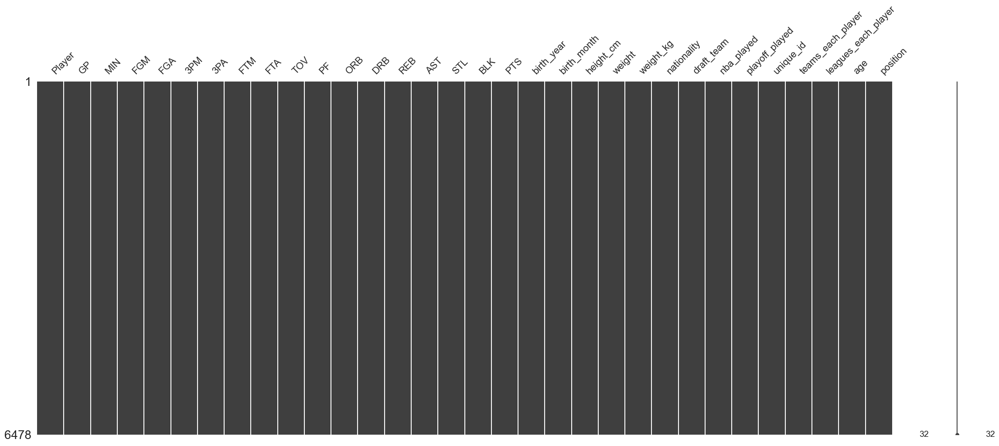

In [195]:
msno.matrix(final_df)

In [301]:
#Duable checking the cleansing
final_df.isnull().sum()

Player                 0
GP                     0
MIN                    0
FGM                    0
FGA                    0
3PM                    0
3PA                    0
FTM                    0
FTA                    0
TOV                    0
PF                     0
ORB                    0
DRB                    0
REB                    0
AST                    0
STL                    0
BLK                    0
PTS                    0
birth_year             0
birth_month            0
height_cm              0
weight                 0
weight_kg              0
nationality            0
draft_team             0
nba_played             0
playoff_played         0
unique_id              0
teams_each_player      0
leagues_each_player    0
age                    0
position               0
dtype: int64

In [197]:
# Save cleaned data
final_df.to_pickle('final_df.pkl')

In [300]:
final_df

,Player,GP,MIN,FGM,FGA,3PM,3PA,FTM,FTA,TOV,PF,ORB,DRB,REB,AST,STL,BLK,PTS,birth_year,birth_month,height_cm,weight,weight_kg,nationality,draft_team,nba_played,playoff_played,unique_id,teams_each_player,leagues_each_player,age,position
0,Kelsey Barlow,27.0,789.4,179.0,414.0,68.0,203.0,81.0,98.0,55.0,74.0,19.0,103.0,122.0,52.0,45.0,14.0,507.0,1991.0,Feb,196.0,200.0,91.0,United States,nan,0,0,fefc9789e91e4fc3b9b3e97506417ab2,1.0,1.0,29.514031,GF
1,Anthony Young,25.0,806.6,160.0,329.0,51.0,125.0,92.0,108.0,34.0,59.0,18.0,123.0,141.0,50.0,20.0,10.0,463.0,1989.0,Dec,201.0,180.0,82.0,United States,nan,0,0,6354c53dfc7f4835a8215d86cc95be6c,1.0,1.0,31.694045,C
2,Pedro Barral,25.0,759.8,153.0,331.0,33.0,93.0,102.0,131.0,78.0,52.0,13.0,84.0,97.0,67.0,24.0,0.0,441.0,1994.0,Oct,185.0,175.0,79.0,Argentina,nan,0,0,8ea081fb36ef4fd4a4698817ea5f66b4,1.0,1.0,26.834360,PG
3,Federico Mariani,24.0,856.3,120.0,277.0,44.0,112.0,135.0,151.0,55.0,36.0,13.0,69.0,82.0,67.0,15.0,2.0,419.0,1992.0,Apr,191.0,176.0,80.0,Argentina,nan,0,0,906da9fbdb0648d8affdb0c40005e87c,1.0,1.0,28.350445,F
4,Caio De Souza Pacheco,21.0,582.7,134.0,296.0,30.0,104.0,110.0,145.0,72.0,49.0,7.0,59.0,66.0,70.0,17.0,2.0,408.0,1999.0,Feb,188.0,190.0,86.0,Brazil,nan,0,0,cc33d7c5addd4e508aec7c7c4c3fac89,1.0,1.0,21.492129,Other
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6473,Anuar Rahimshaikov,13.0,91.6,8.0,17.0,0.0,2.0,5.0,5.0,4.0,10.0,1.0,6.0,7.0,4.0,4.0,0.0,21.0,1997.0,Mar,188.0,185.0,84.0,Ukraine,nan,0,0,46ae1416450d417f87b313b087864547,1.0,1.0,23.405886,SG
6474,Kyrylo Meshheryakov,15.0,127.0,7.0,28.0,2.0,13.0,3.0,4.0,5.0,27.0,4.0,14.0,18.0,8.0,1.0,3.0,19.0,1995.0,Aug,198.0,182.0,83.0,Ukraine,nan,0,0,9495d3ff0f6649fb92fdc98863e7a6ad,1.0,1.0,25.010267,F
6475,Yaroslav Kadygrob,10.0,81.7,5.0,16.0,4.0,14.0,1.0,3.0,3.0,2.0,2.0,4.0,6.0,3.0,0.0,0.0,15.0,1991.0,Oct,191.0,187.0,85.0,Ukraine,nan,0,0,21c3d427035f4c96b2eed4c4ddc8acd5,1.0,1.0,29.813142,G
6476,Ernesto Tkachuk,16.0,124.7,1.0,15.0,0.0,11.0,7.0,14.0,11.0,12.0,0.0,15.0,15.0,10.0,6.0,1.0,9.0,1994.0,Sep,188.0,200.0,91.0,Ukraine,nan,0,0,c98a3ecd9078448a98a0f3097ef785c6,1.0,1.0,26.924709,PG


In [287]:
knn_df = df_cleaned.copy()

In [288]:
knn_df

,Player,GP,MIN,FGM,FGA,3PM,3PA,FTM,FTA,TOV,PF,ORB,DRB,REB,AST,STL,BLK,PTS,birth_year,birth_month,height_cm,weight,weight_kg,nationality,draft_team,nba_played,playoff_played,unique_id,teams_each_player,leagues_each_player,age,position
0,Kelsey Barlow,27,789.4,179,414,68,203,81,98,55,74,19,103,122,NaN,45,14,507,1991.0,Feb,196.0,200.0,91.0,United States,nan,0,0,fefc9789e91e4fc3b9b3e97506417ab2,1.0,1.0,29.514031,GF
1,Anthony Young,25,806.6,160,329,51,125,92,108,34,59,18,123,141,50.0,20,10,463,1989.0,Dec,201.0,NaN,NaN,United States,nan,0,0,6354c53dfc7f4835a8215d86cc95be6c,1.0,1.0,31.694045,C
2,Pedro Barral,25,759.8,153,331,33,93,102,131,78,52,13,84,97,NaN,24,0,441,1994.0,Oct,185.0,175.0,79.0,Argentina,nan,0,0,8ea081fb36ef4fd4a4698817ea5f66b4,1.0,1.0,26.834360,PG
3,Federico Mariani,24,856.3,120,277,44,112,135,151,55,36,13,69,82,67.0,15,2,419,1992.0,Apr,191.0,NaN,NaN,Argentina,nan,0,0,906da9fbdb0648d8affdb0c40005e87c,1.0,1.0,28.350445,F
4,Caio De Souza Pacheco,21,582.7,134,296,30,104,110,145,72,49,7,59,66,NaN,17,2,408,1999.0,Feb,188.0,190.0,86.0,Brazil,nan,0,0,cc33d7c5addd4e508aec7c7c4c3fac89,1.0,1.0,21.492129,Other
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6473,Anuar Rahimshaikov,13,91.6,8,17,0,2,5,5,4,10,1,6,7,4.0,4,0,21,1997.0,Mar,188.0,NaN,NaN,Ukraine,nan,0,0,46ae1416450d417f87b313b087864547,1.0,1.0,23.405886,SG
6474,Kyrylo Meshheryakov,15,127.0,7,28,2,13,3,4,5,27,4,14,18,8.0,1,3,19,1995.0,Aug,198.0,182.0,83.0,Ukraine,nan,0,0,9495d3ff0f6649fb92fdc98863e7a6ad,1.0,1.0,25.010267,F
6475,Yaroslav Kadygrob,10,81.7,5,16,4,14,1,3,3,2,2,4,6,3.0,0,0,15,1991.0,Oct,191.0,187.0,85.0,Ukraine,nan,0,0,21c3d427035f4c96b2eed4c4ddc8acd5,1.0,1.0,29.813142,G
6476,Ernesto Tkachuk,16,124.7,1,15,0,11,7,14,11,12,0,15,15,10.0,6,1,9,1994.0,Sep,188.0,200.0,91.0,Ukraine,nan,0,0,c98a3ecd9078448a98a0f3097ef785c6,1.0,1.0,26.924709,PG


In [289]:
imp_cols_knn = knn_df.select_dtypes(include = ['float64', 'int64']).columns

In [290]:
imp_cols_knn

Index(['GP', 'MIN', 'FGM', 'FGA', '3PM', '3PA', 'FTM', 'FTA', 'TOV', 'PF',
       'ORB', 'DRB', 'REB', 'AST', 'STL', 'BLK', 'PTS', 'birth_year',
       'height_cm', 'weight', 'weight_kg', 'teams_each_player',
       'leagues_each_player', 'age'],
      dtype='object')

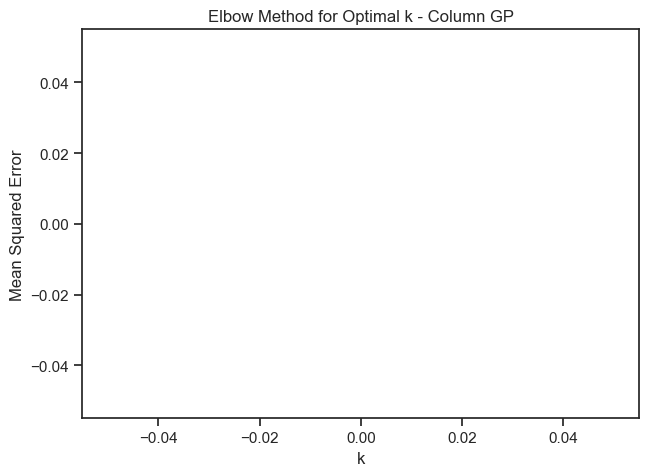

No optimal k found for column GP due to lack of missing values.


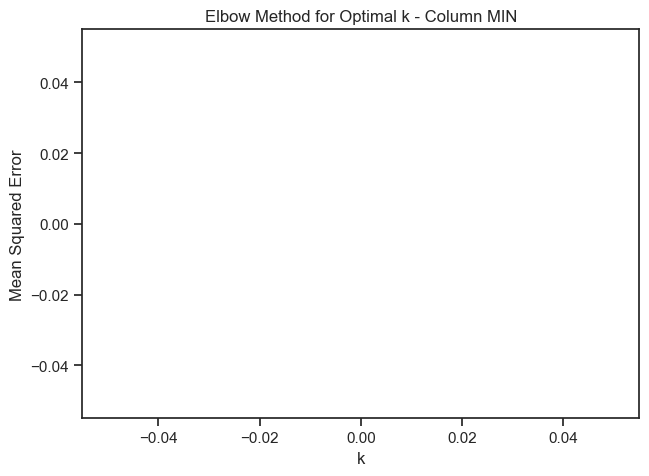

No optimal k found for column MIN due to lack of missing values.


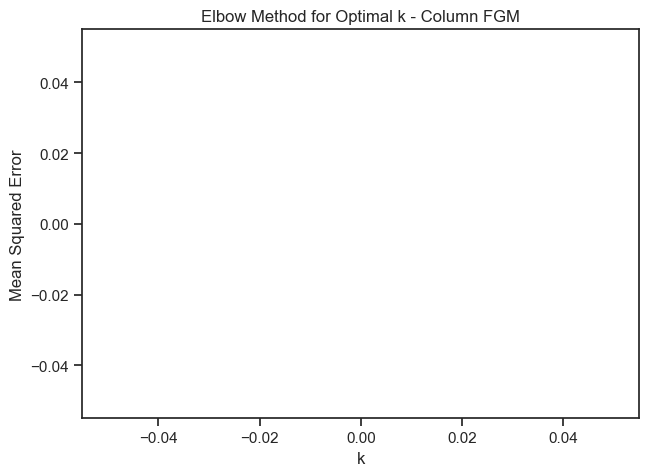

No optimal k found for column FGM due to lack of missing values.


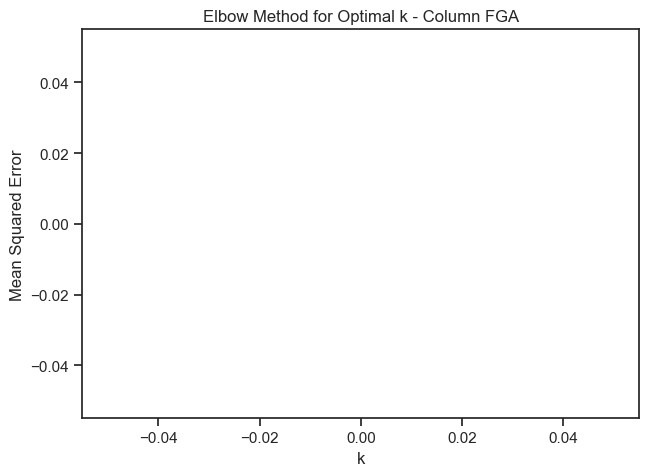

No optimal k found for column FGA due to lack of missing values.


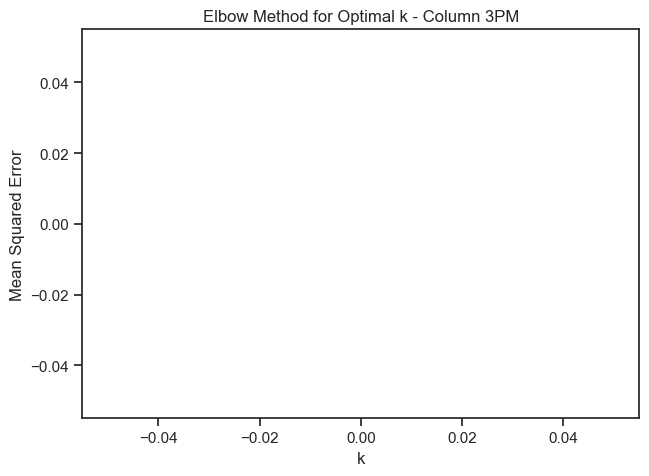

No optimal k found for column 3PM due to lack of missing values.


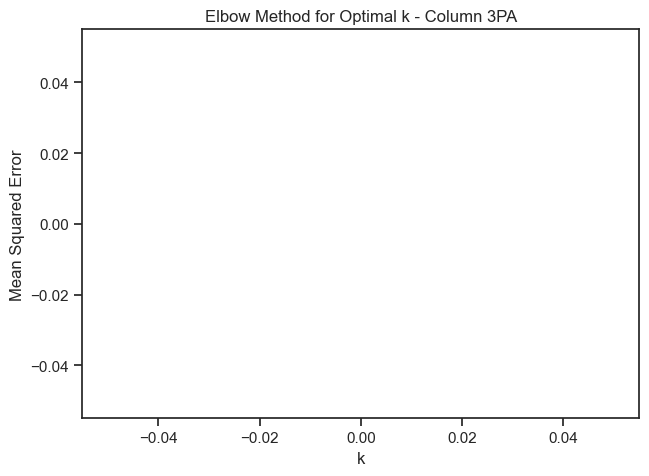

No optimal k found for column 3PA due to lack of missing values.


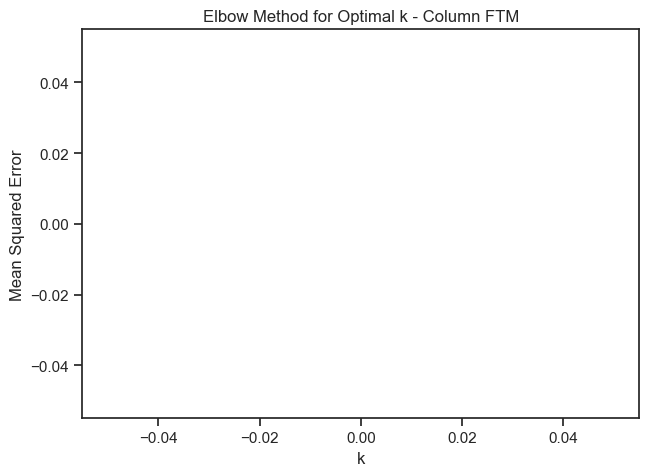

No optimal k found for column FTM due to lack of missing values.


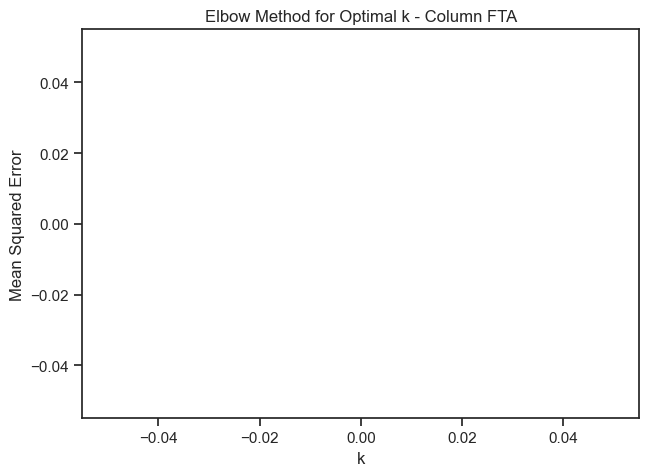

No optimal k found for column FTA due to lack of missing values.


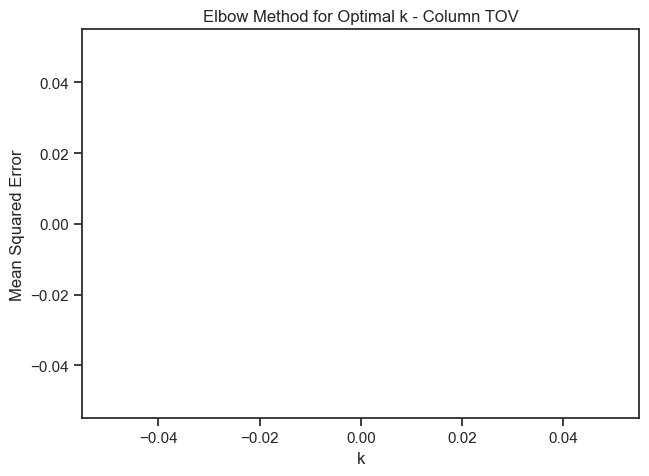

No optimal k found for column TOV due to lack of missing values.


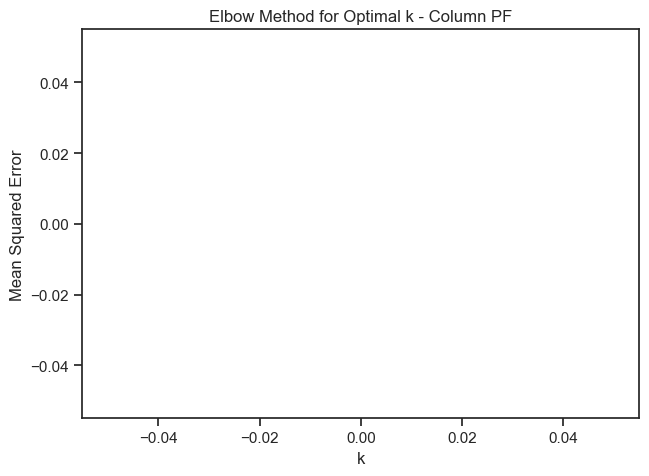

No optimal k found for column PF due to lack of missing values.


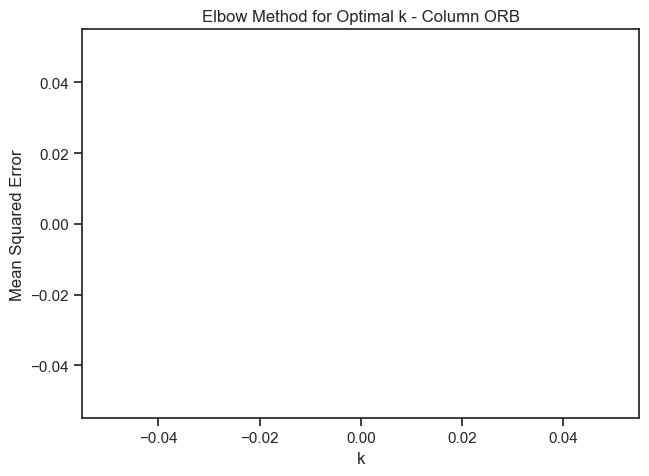

No optimal k found for column ORB due to lack of missing values.


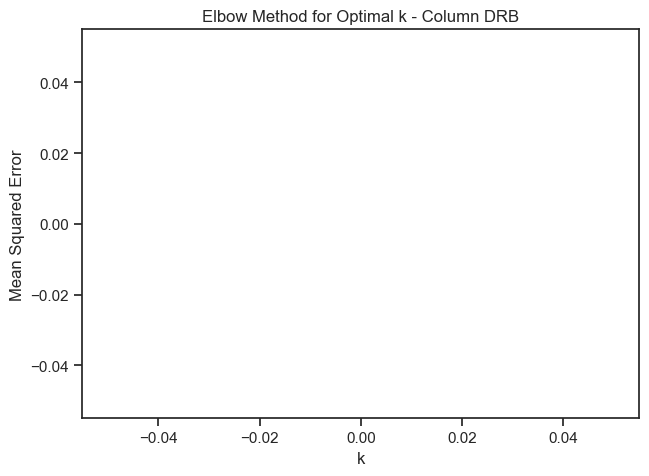

No optimal k found for column DRB due to lack of missing values.


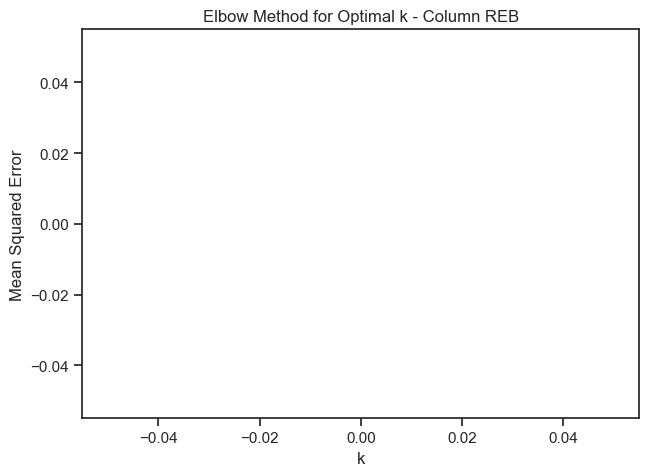

No optimal k found for column REB due to lack of missing values.


ValueError: Input contains NaN.

In [299]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.impute import KNNImputer
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split


# חלוקת הנתונים לסט אימון וסט בדיקה
train_data, test_data = train_test_split(knn_df[imp_cols_knn], test_size=0.2, random_state=42)

# רשימת ערכי k לבדיקה
k_values = range(1, 21)
optimal_k_values = {}

for column in knn_df[imp_cols_knn].columns:
    errors = []
    for k in k_values:
        # יצירת אובייקט KNNImputer עם k נוכחי
        imputer = KNNImputer(n_neighbors=k)
        
        # השלמת הערכים החסרים על סט האימון
        imputed_train_data = imputer.fit_transform(train_data)
        
        # השלמת הערכים החסרים על סט הבדיקה
        imputed_test_data = imputer.transform(test_data)
        
        # חישוב מסכה לערכים חסרים בעמודה הנוכחית
        mask = np.isnan(test_data[column].values)
        
        # רק אם יש ערכים חסרים במסכה, נבצע את החישוב
        if np.any(mask):
            # חישוב MSE עבור העמודה הנוכחית
            mse = mean_squared_error(test_data[column].values[mask], imputed_test_data[:, knn_df[imp_cols_knn].columns.get_loc(column)][mask])
            errors.append(mse)
        else:
            errors.append(np.nan)  # אם אין ערכים חסרים, נכניס NaN כדי לשמור על המבנה
    
    # גרף של שגיאה מול ערכי k עבור העמודה הנוכחית
    plt.plot(k_values, errors, marker='o')
    plt.xlabel('k')
    plt.ylabel('Mean Squared Error')
    plt.title(f'Elbow Method for Optimal k - Column {column}')
    plt.show()
    
    # מציאת k עם השגיאה המינימלית עבור העמודה הנוכחית
    if not all(np.isnan(errors)):
        optimal_k = k_values[np.nanargmin(errors)]
        optimal_k_values[column] = optimal_k
        print(f'Optimal k for column {column}: {optimal_k}')
    else:
        print(f"No optimal k found for column {column} due to lack of missing values.")

# תוצאה סופית: k אופטימלי לכל עמודה
print("Optimal k values for each column:")
print(optimal_k_values)
